## Network Trace Analysis
The network information of some mobile phones in wifi and LTE is collected, mainly simulating the network status under strong network, medium network and weak network. The format is:

| Timestamp (s)  | Throughput (Mbps) | Rtt (ms) |
| :---: | :---: | :---: |
| 0.5  | 1.478  | ...  |
| 1.0  | 2.476  | ...  |
| ...  | ...  | ...  |

In [1]:
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import os

%matplotlib inline
matplotlib.style.use('ggplot')

In [2]:
def plot_thp_rtt(trace_file, title):
    time_s = []
    thp_mbps = []
    rtt_ms = []
    with open(trace_file, 'rb') as f:
        for line in f:
            parse = line.split()
            time_s.append(float(parse[0]))
            thp_mbps.append(float(parse[1]))
            rtt_ms.append(float(parse[2]))
    time_s = np.array(time_s)
    thp_mbps = np.array(thp_mbps)
    rtt_ms = np.array(rtt_ms)
    
    fig, axs = plt.subplot(2, 1)
    axs[0].plot(time_s, thp_mbps)
    axs[0].set_xlabel('time')
    axs[0].set_ylabel('throughput (Mbps)')
    axs[0].grid(True)
    
    axs[1].plot(time_s, rtt_ms)
    axs[1].set_ylabel('rtt (ms)')

    fig.tight_layout()
    plt.title(title)
    plt.show()
    
    return thp_mbps, rtt_ms

In [42]:
def plot_thp(trace_file, title, start=0, end=5800):
    time_s = []
    thp_mbps = []
    with open(trace_file, 'rb') as f:
        for line in f:
            parse = line.split()
            if len(parse) == 2:
                try:
                    time_s.append(float(parse[0]))
                    thp_mbps.append(float(parse[1]))
                except ValueError:
                    print('we got an error: ', parse[0], parse[1])
    time_s = np.array(time_s)
    thp_mbps = np.array(thp_mbps)
    
    fig = plt.figure(figsize=(20,10))
    plt.plot(time_s[start:end], thp_mbps[start:end])
    plt.xlabel('time')
    plt.ylabel('throughput (Mbps)')
    plt.title(title)
#     plt.tight_layout()
    plt.show()
    
    return thp_mbps[start:end]

In [43]:
def get_analysis_result(path, start=0, end=5800):
    for root, dirnames, filenames in os.walk(os.path.abspath(path)):
        for filename in filenames:
            trace_file = os.path.join(root, filename)
            parse = trace_file.split('/')
            title = parse[-1]
        
            thp_mbps = plot_thp(trace_file, title, start, end)

            print('Average: %.3f' % (np.average(thp_mbps)))
            print('Max: %.3f' % (np.max(thp_mbps)))
            print('Min: %.3f' % (np.min(thp_mbps)))
#             print('Median: %.3f' % (np.median(thp_mbps)))
            print('Percentile (5): %.3f' % (np.percentile(thp_mbps, 5)))
            print('Percentile (20): %.3f' % (np.percentile(thp_mbps, 20)))
            print('Percentile (50): %.3f' % (np.percentile(thp_mbps, 50)))
            print('Percentile (80): %.3f' % (np.percentile(thp_mbps, 80)))
            print('Percentile (95): %.3f' % (np.percentile(thp_mbps, 95)))
            

### Mixed Network Trace Analysis

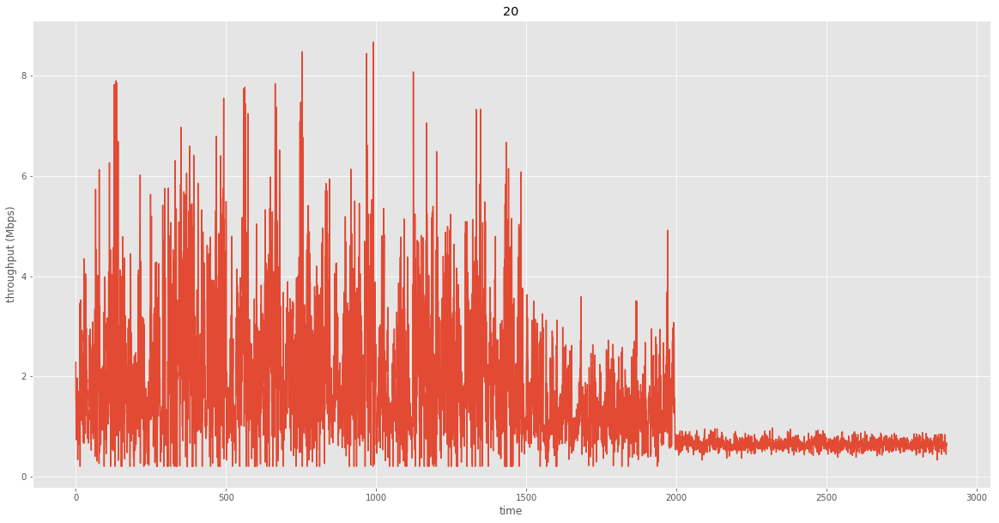

Average: 1.615
Max: 8.678
Min: 0.200
Percentile (5): 0.502
Percentile (20): 0.642
Percentile (50): 1.172
Percentile (80): 2.498
Percentile (95): 4.150


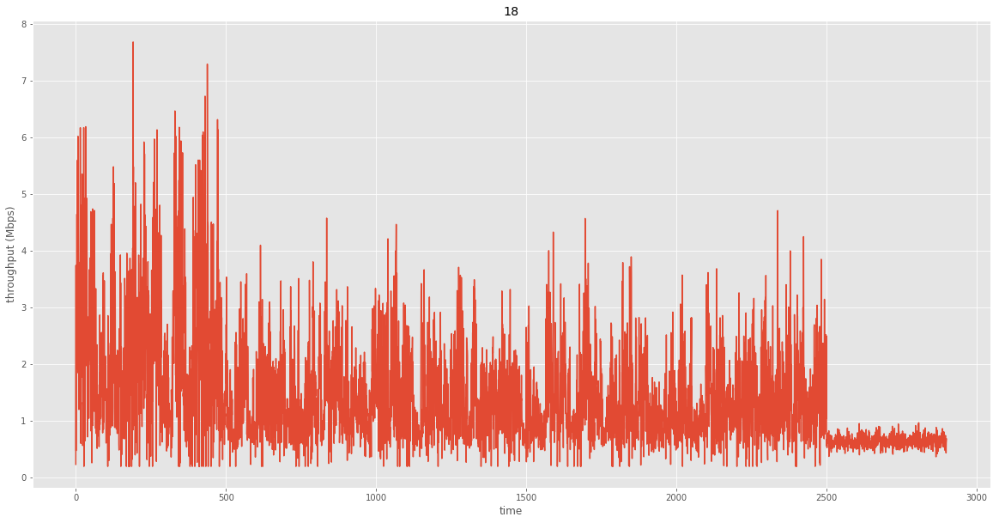

Average: 1.430
Max: 7.680
Min: 0.200
Percentile (5): 0.518
Percentile (20): 0.698
Percentile (50): 1.183
Percentile (80): 2.033
Percentile (95): 3.182


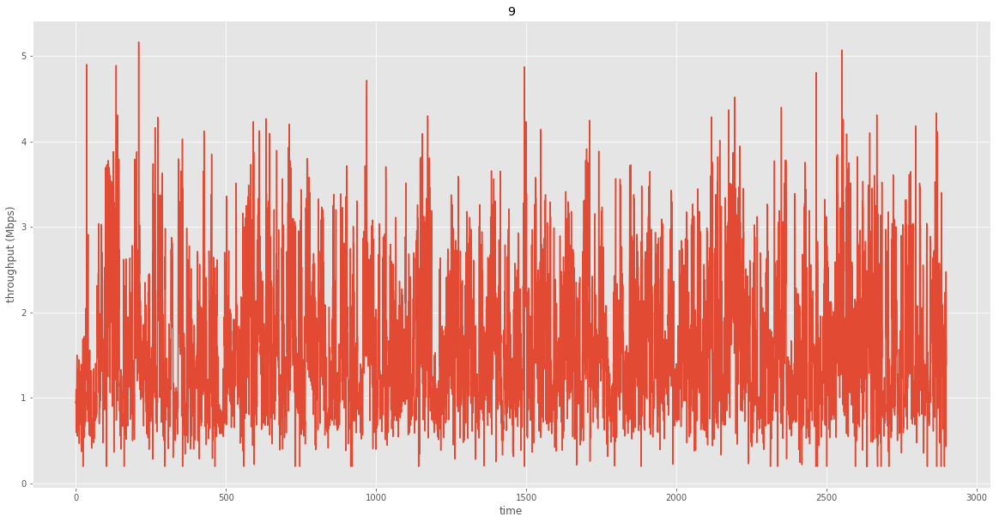

Average: 1.634
Max: 5.164
Min: 0.200
Percentile (5): 0.627
Percentile (20): 0.937
Percentile (50): 1.488
Percentile (80): 2.301
Percentile (95): 3.140


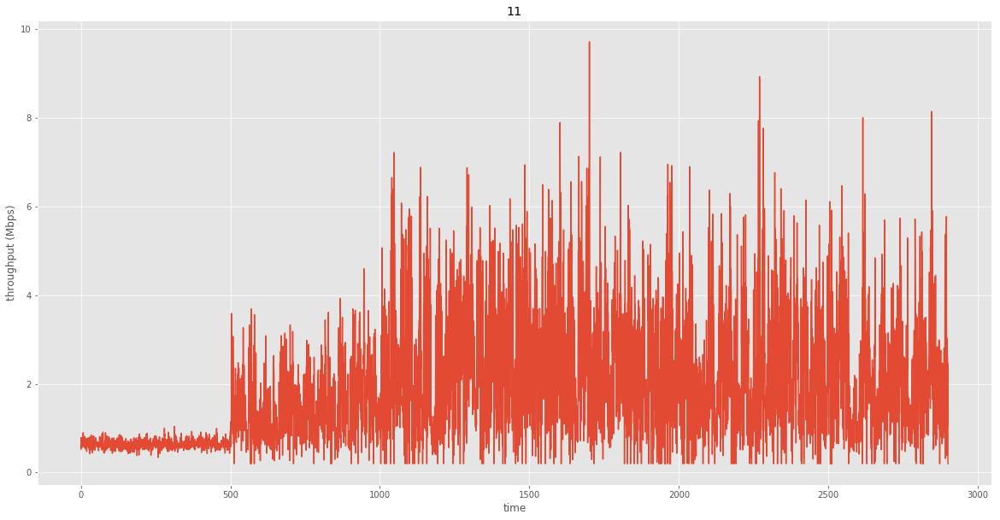

Average: 1.933
Max: 9.717
Min: 0.200
Percentile (5): 0.515
Percentile (20): 0.714
Percentile (50): 1.639
Percentile (80): 3.012
Percentile (95): 4.497


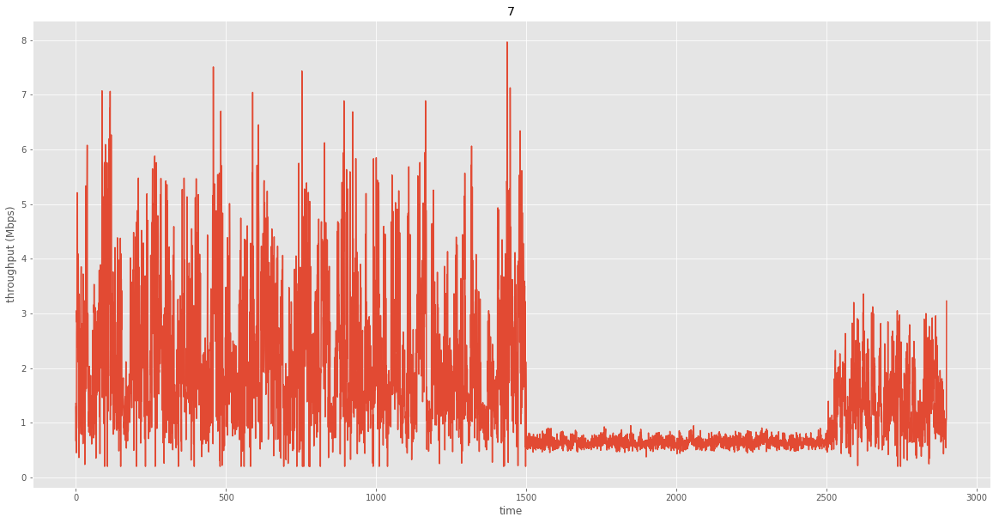

Average: 1.598
Max: 7.966
Min: 0.200
Percentile (5): 0.542
Percentile (20): 0.640
Percentile (50): 1.185
Percentile (80): 2.478
Percentile (95): 4.061


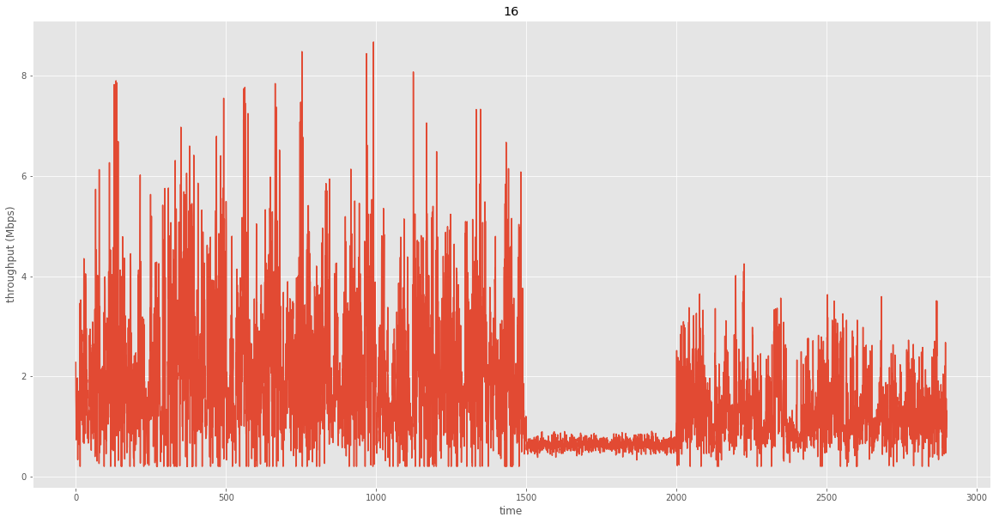

Average: 1.712
Max: 8.678
Min: 0.200
Percentile (5): 0.502
Percentile (20): 0.687
Percentile (50): 1.382
Percentile (80): 2.575
Percentile (95): 4.150


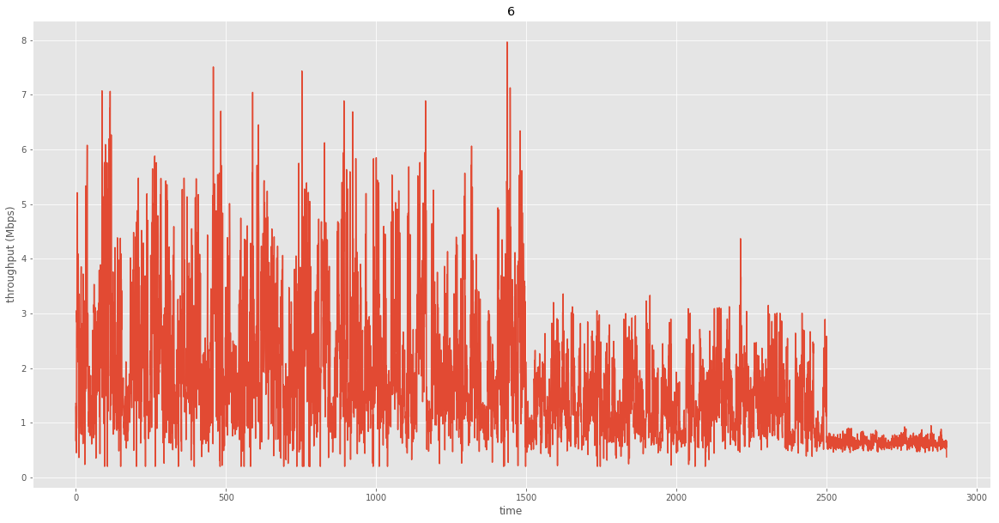

Average: 1.748
Max: 7.966
Min: 0.200
Percentile (5): 0.565
Percentile (20): 0.748
Percentile (50): 1.477
Percentile (80): 2.538
Percentile (95): 4.061


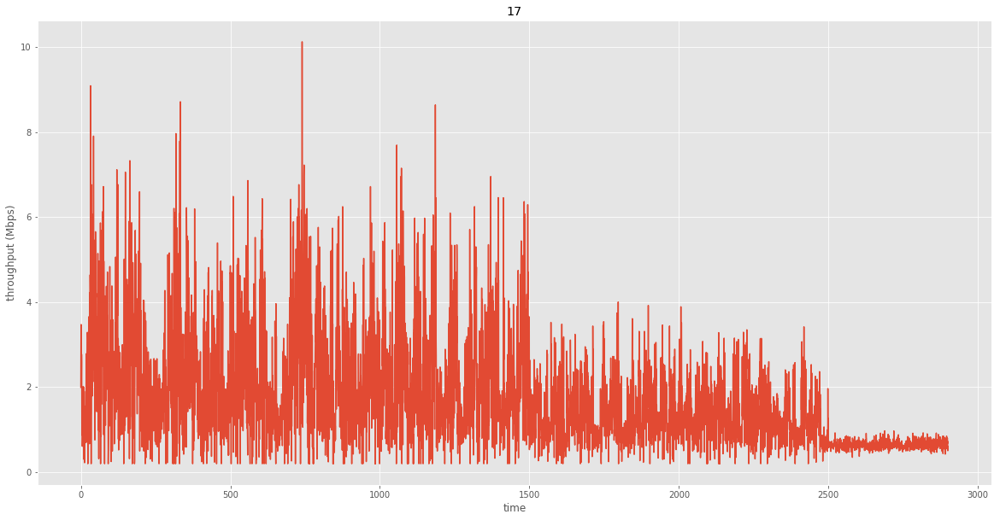

Average: 1.763
Max: 10.125
Min: 0.200
Percentile (5): 0.511
Percentile (20): 0.723
Percentile (50): 1.423
Percentile (80): 2.618
Percentile (95): 4.268


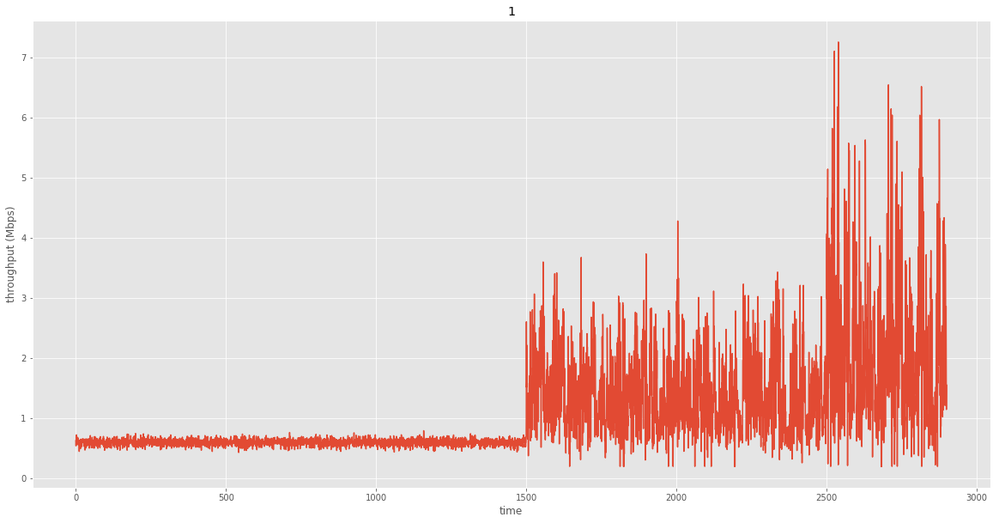

Average: 1.094
Max: 7.264
Min: 0.200
Percentile (5): 0.526
Percentile (20): 0.582
Percentile (50): 0.664
Percentile (80): 1.587
Percentile (95): 2.694


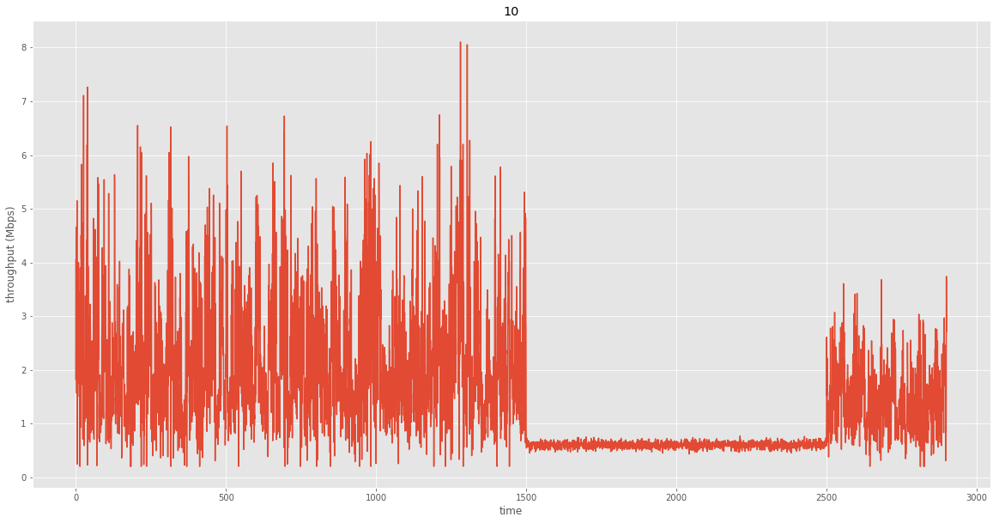

Average: 1.563
Max: 8.105
Min: 0.200
Percentile (5): 0.536
Percentile (20): 0.604
Percentile (50): 1.225
Percentile (80): 2.444
Percentile (95): 3.899


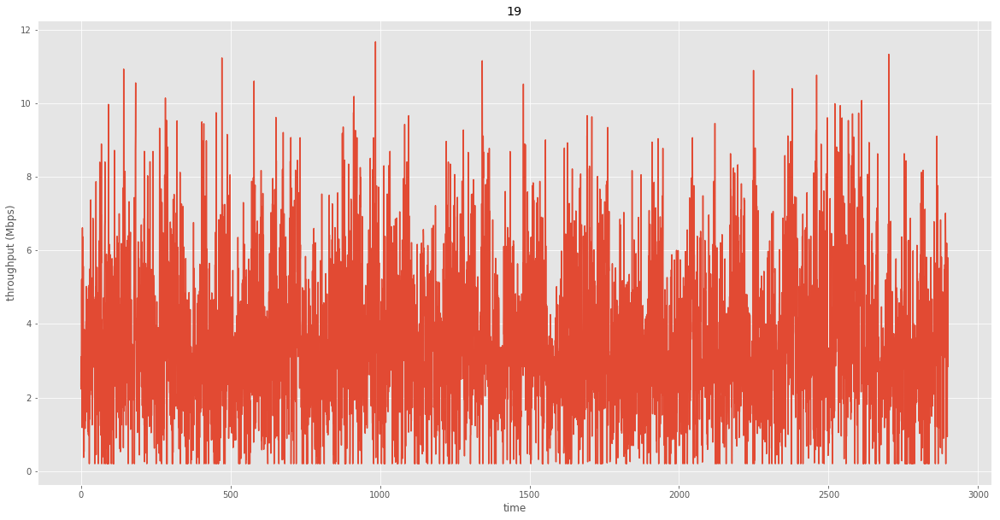

Average: 3.593
Max: 11.679
Min: 0.200
Percentile (5): 0.500
Percentile (20): 1.927
Percentile (50): 3.382
Percentile (80): 5.156
Percentile (95): 7.174


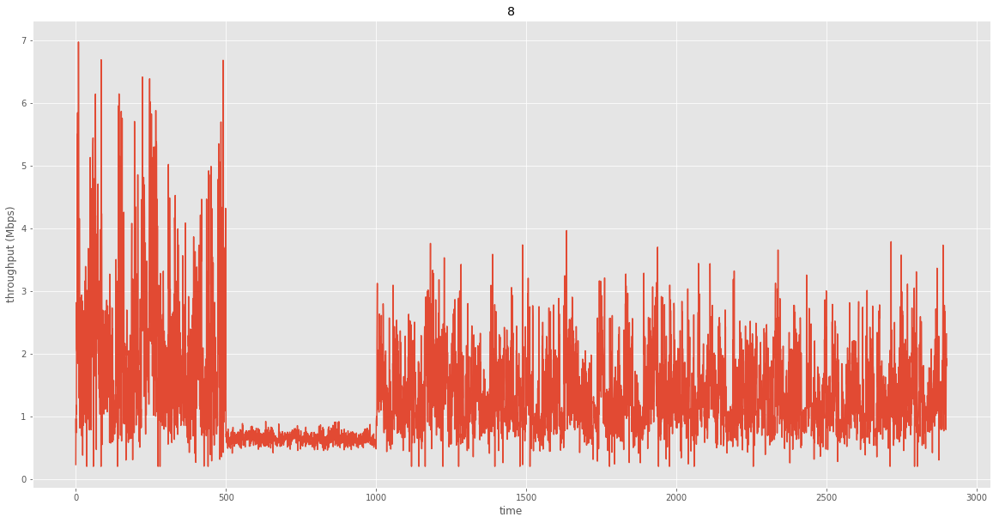

Average: 1.402
Max: 6.973
Min: 0.200
Percentile (5): 0.567
Percentile (20): 0.714
Percentile (50): 1.192
Percentile (80): 1.932
Percentile (95): 2.937


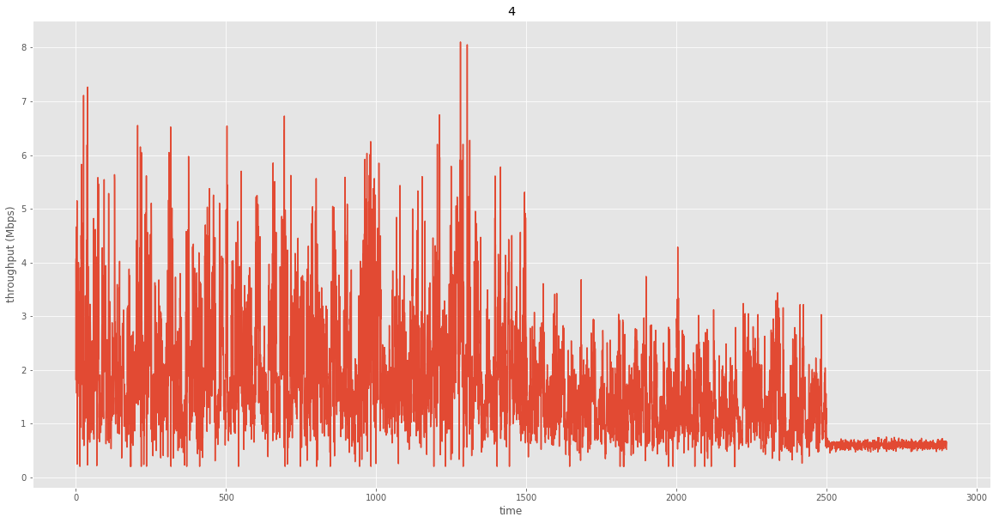

Average: 1.722
Max: 8.105
Min: 0.200
Percentile (5): 0.557
Percentile (20): 0.731
Percentile (50): 1.463
Percentile (80): 2.519
Percentile (95): 3.900


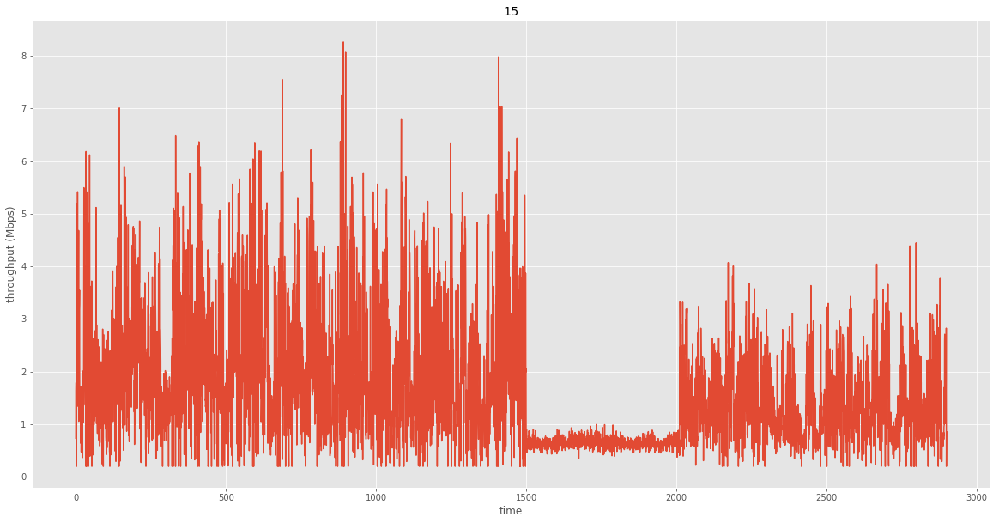

Average: 1.696
Max: 8.261
Min: 0.200
Percentile (5): 0.501
Percentile (20): 0.690
Percentile (50): 1.386
Percentile (80): 2.565
Percentile (95): 4.021


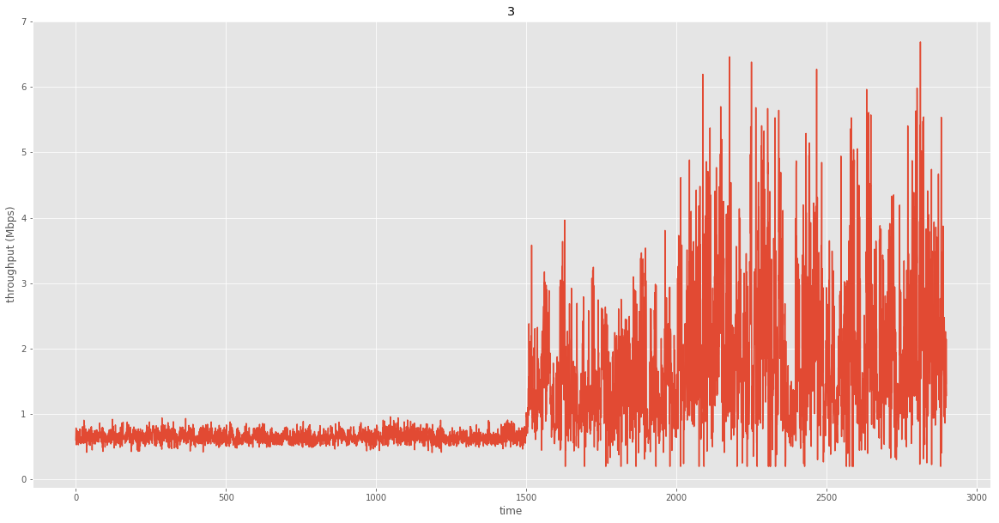

Average: 1.260
Max: 6.687
Min: 0.200
Percentile (5): 0.538
Percentile (20): 0.616
Percentile (50): 0.757
Percentile (80): 1.884
Percentile (95): 3.357


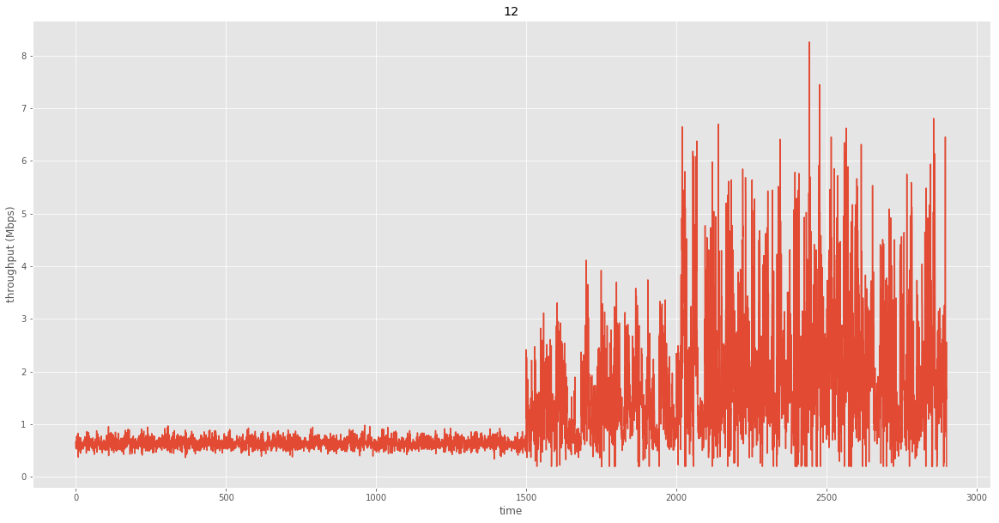

Average: 1.265
Max: 8.258
Min: 0.200
Percentile (5): 0.507
Percentile (20): 0.602
Percentile (50): 0.745
Percentile (80): 1.904
Percentile (95): 3.532


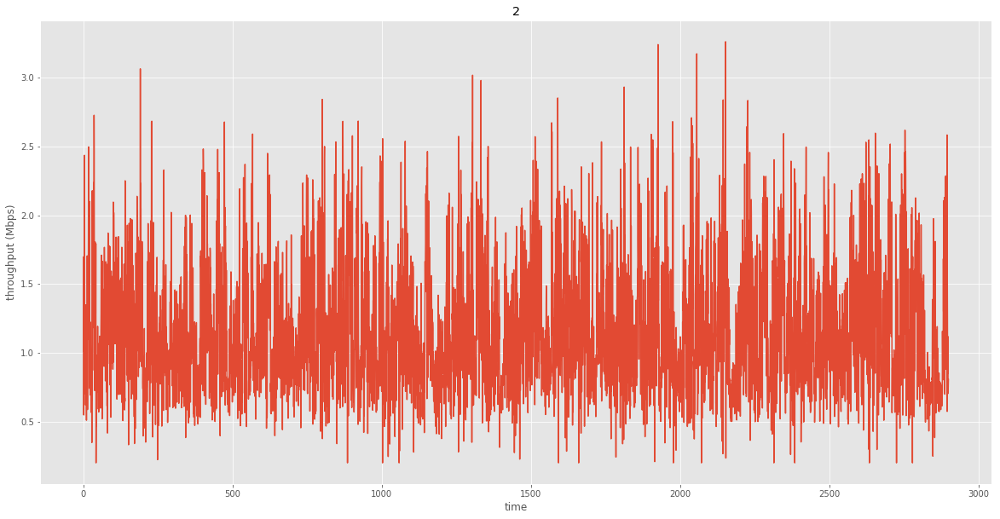

Average: 1.171
Max: 3.262
Min: 0.200
Percentile (5): 0.583
Percentile (20): 0.790
Percentile (50): 1.095
Percentile (80): 1.531
Percentile (95): 2.016


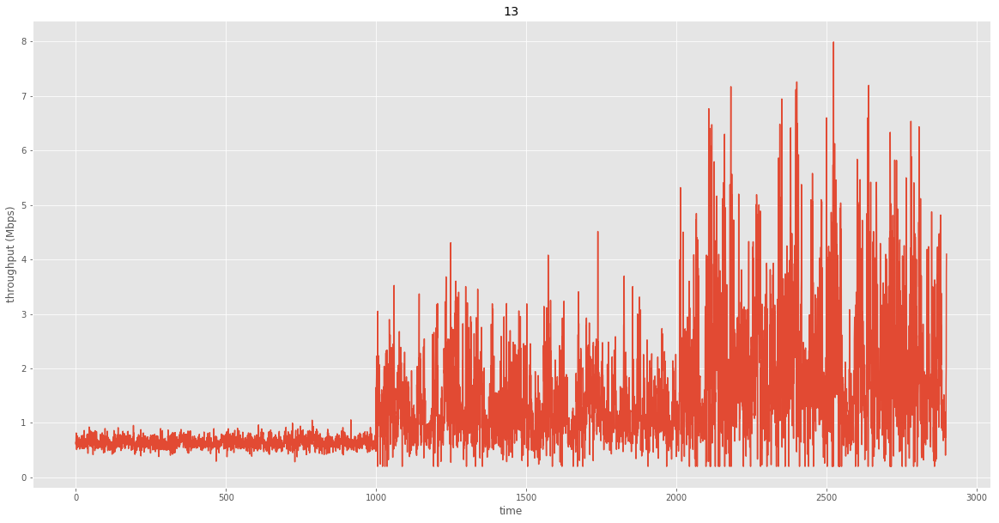

Average: 1.346
Max: 7.993
Min: 0.200
Percentile (5): 0.503
Percentile (20): 0.625
Percentile (50): 0.937
Percentile (80): 1.945
Percentile (95): 3.501


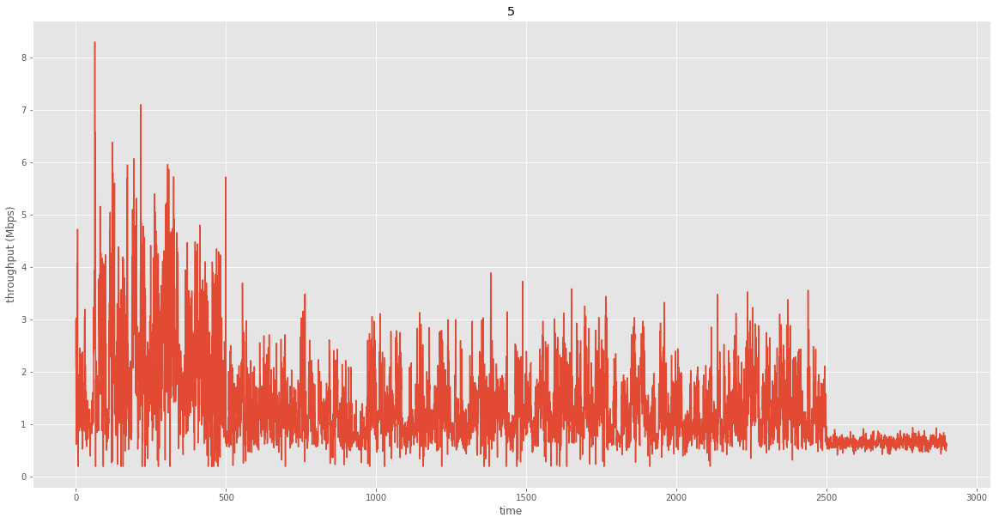

Average: 1.375
Max: 8.288
Min: 0.200
Percentile (5): 0.569
Percentile (20): 0.720
Percentile (50): 1.151
Percentile (80): 1.869
Percentile (95): 3.026


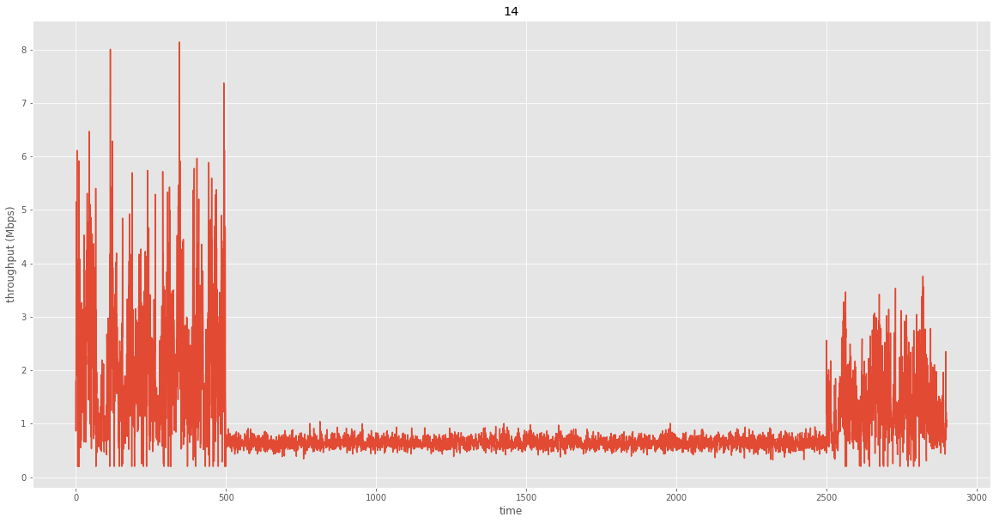

Average: 1.018
Max: 8.142
Min: 0.200
Percentile (5): 0.507
Percentile (20): 0.587
Percentile (50): 0.685
Percentile (80): 1.266
Percentile (95): 2.830


In [46]:
get_analysis_result('new_network_trace/')

### Middle Network Analysis

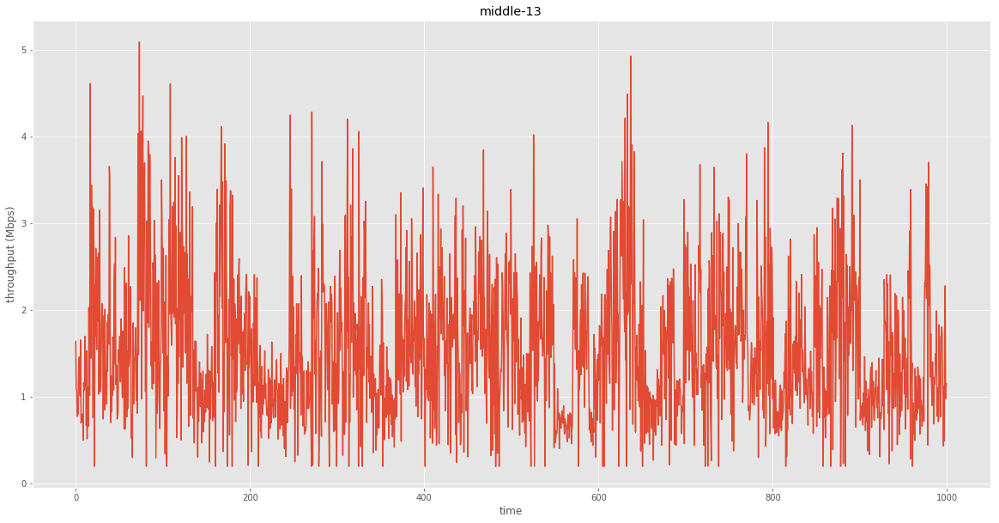

Average: 1.548
Max: 5.749
Min: 0.200
Percentile (5): 0.498
Percentile (20): 0.839
Percentile (50): 1.355
Percentile (80): 2.194
Percentile (95): 3.225


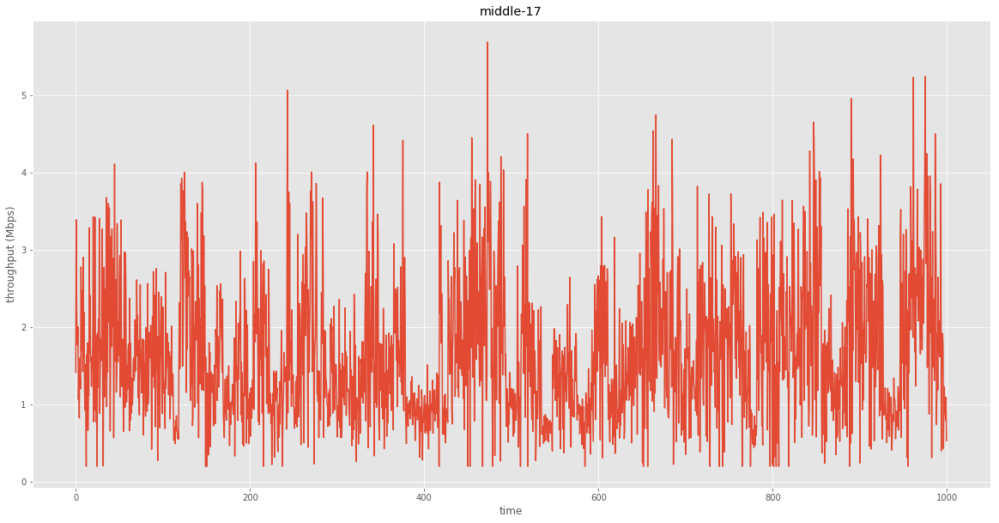

Average: 1.598
Max: 5.689
Min: 0.200
Percentile (5): 0.513
Percentile (20): 0.873
Percentile (50): 1.426
Percentile (80): 2.258
Percentile (95): 3.316


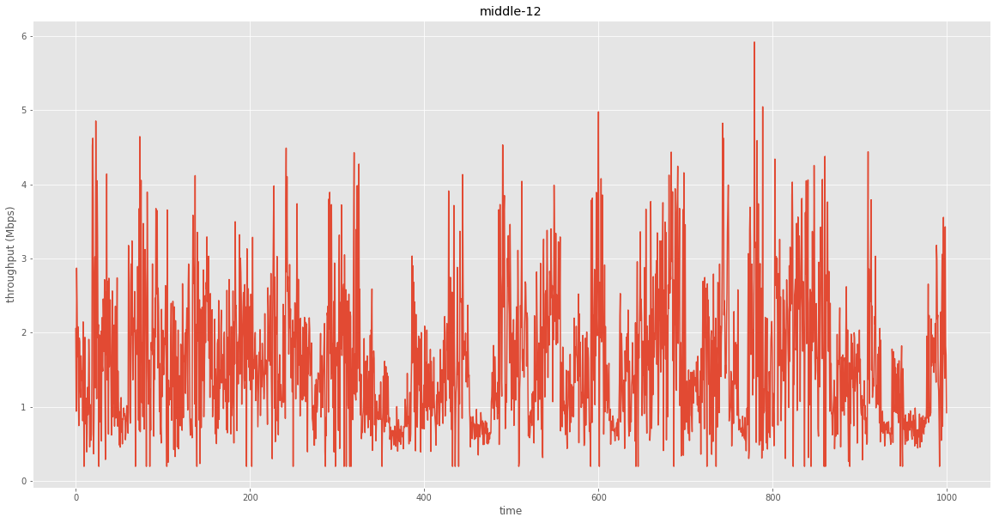

Average: 1.613
Max: 6.344
Min: 0.200
Percentile (5): 0.498
Percentile (20): 0.847
Percentile (50): 1.453
Percentile (80): 2.305
Percentile (95): 3.309


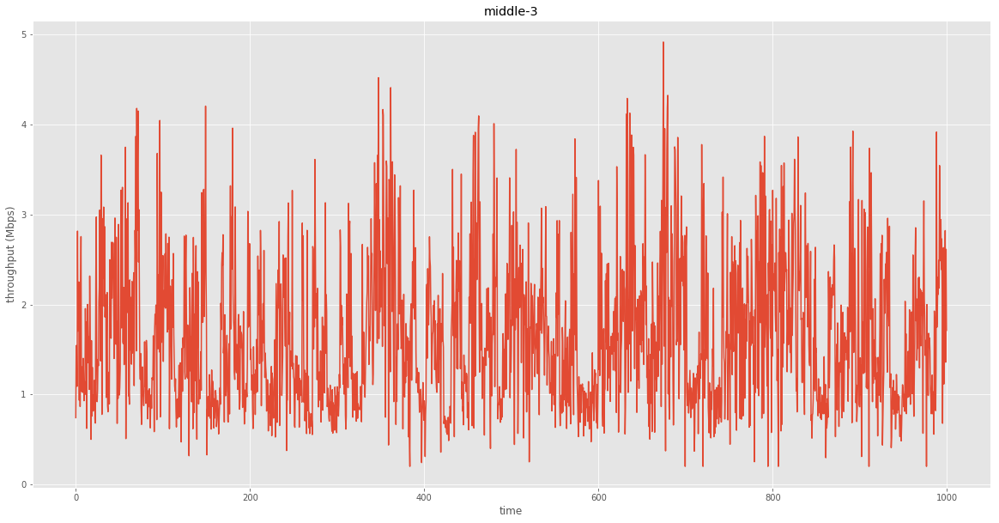

Average: 1.633
Max: 5.697
Min: 0.200
Percentile (5): 0.627
Percentile (20): 0.912
Percentile (50): 1.479
Percentile (80): 2.299
Percentile (95): 3.200


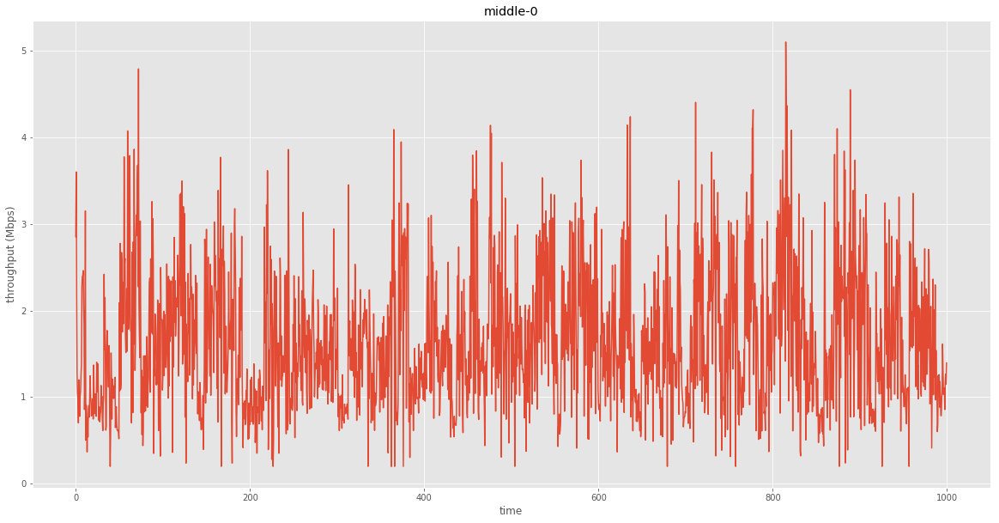

Average: 1.639
Max: 6.073
Min: 0.200
Percentile (5): 0.620
Percentile (20): 0.940
Percentile (50): 1.496
Percentile (80): 2.276
Percentile (95): 3.122


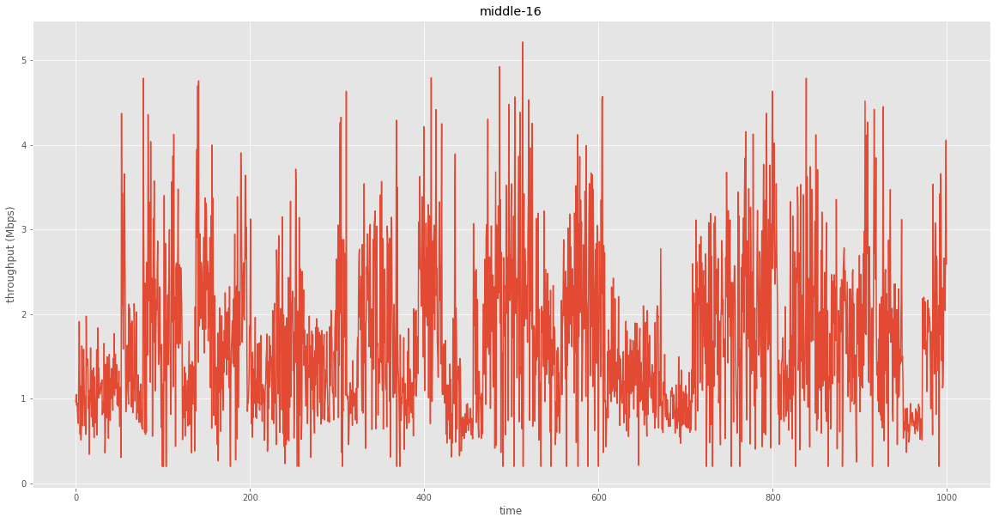

Average: 1.679
Max: 5.687
Min: 0.200
Percentile (5): 0.511
Percentile (20): 0.888
Percentile (50): 1.525
Percentile (80): 2.391
Percentile (95): 3.389


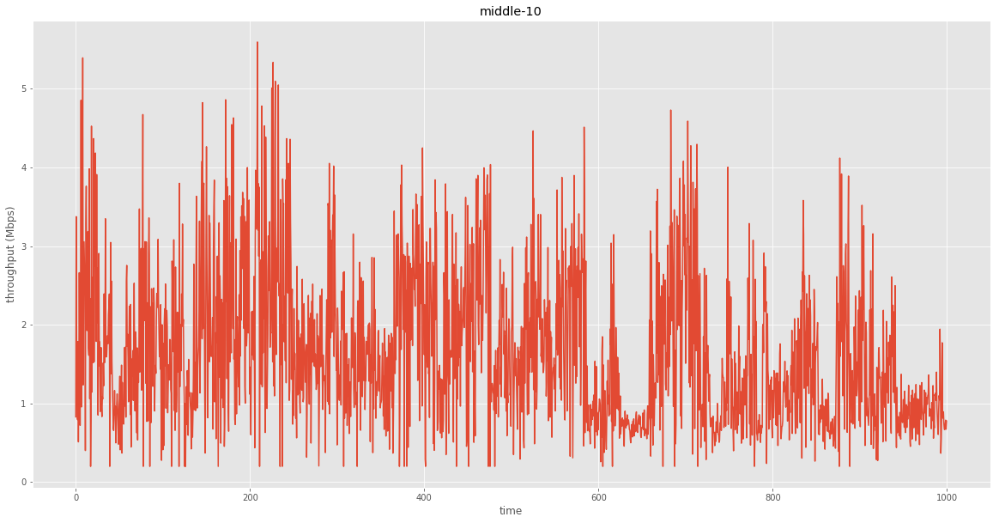

Average: 1.649
Max: 5.833
Min: 0.200
Percentile (5): 0.495
Percentile (20): 0.845
Percentile (50): 1.471
Percentile (80): 2.391
Percentile (95): 3.404


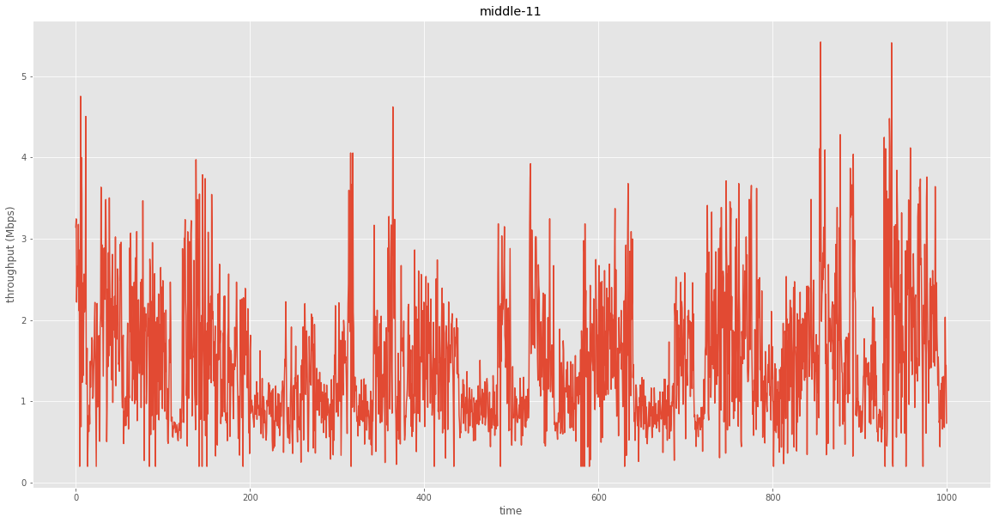

Average: 1.490
Max: 5.830
Min: 0.200
Percentile (5): 0.481
Percentile (20): 0.817
Percentile (50): 1.316
Percentile (80): 2.103
Percentile (95): 3.069


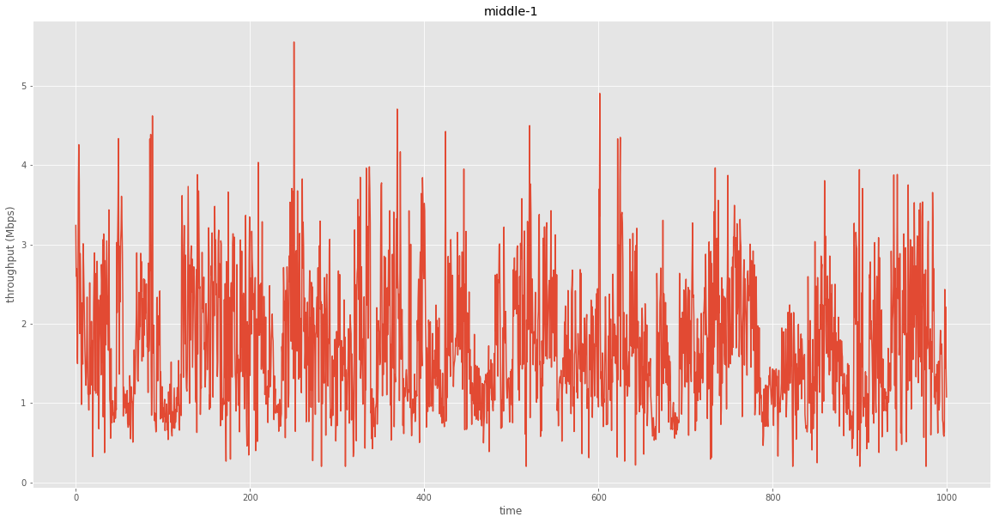

Average: 1.647
Max: 5.555
Min: 0.200
Percentile (5): 0.637
Percentile (20): 0.952
Percentile (50): 1.502
Percentile (80): 2.295
Percentile (95): 3.142


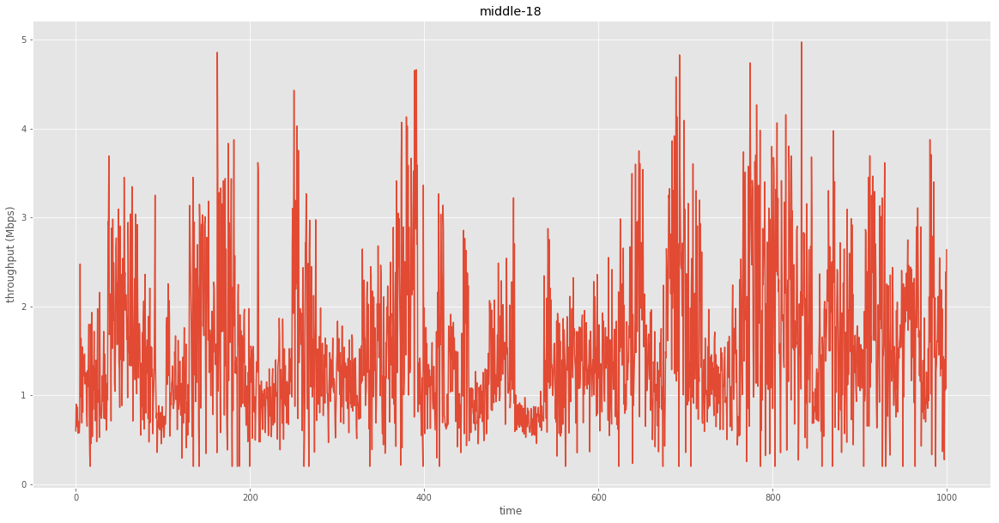

Average: 1.544
Max: 5.920
Min: 0.200
Percentile (5): 0.523
Percentile (20): 0.853
Percentile (50): 1.363
Percentile (80): 2.196
Percentile (95): 3.183


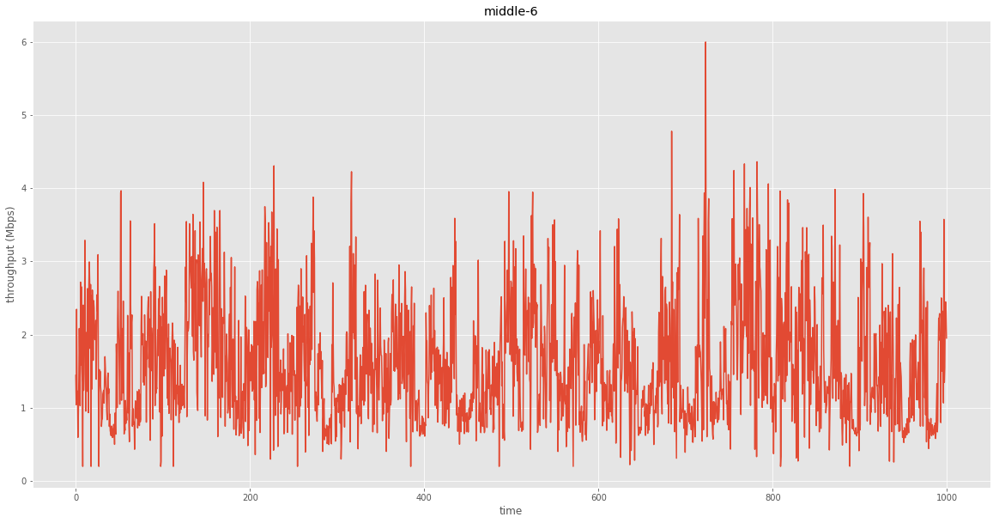

Average: 1.620
Max: 5.999
Min: 0.200
Percentile (5): 0.620
Percentile (20): 0.905
Percentile (50): 1.461
Percentile (80): 2.278
Percentile (95): 3.198


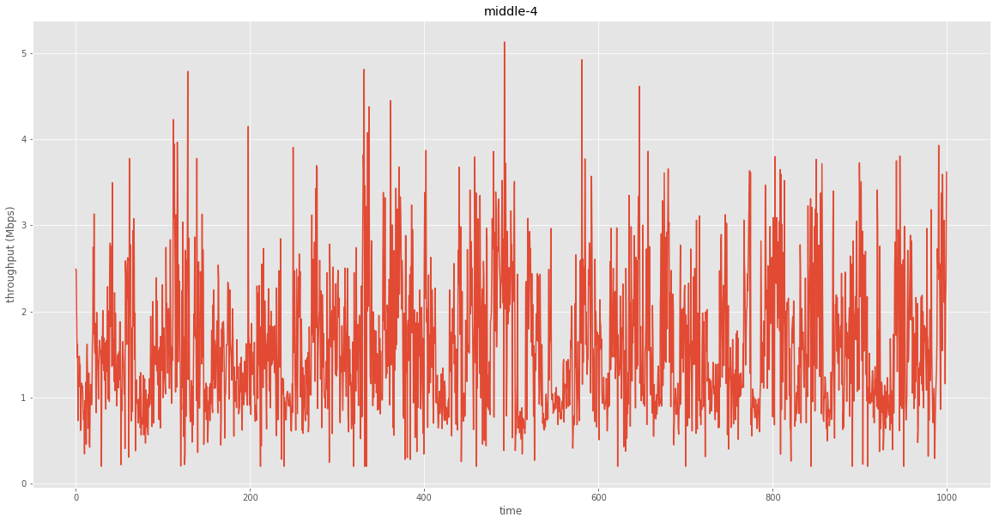

Average: 1.590
Max: 5.316
Min: 0.200
Percentile (5): 0.608
Percentile (20): 0.903
Percentile (50): 1.464
Percentile (80): 2.217
Percentile (95): 3.064


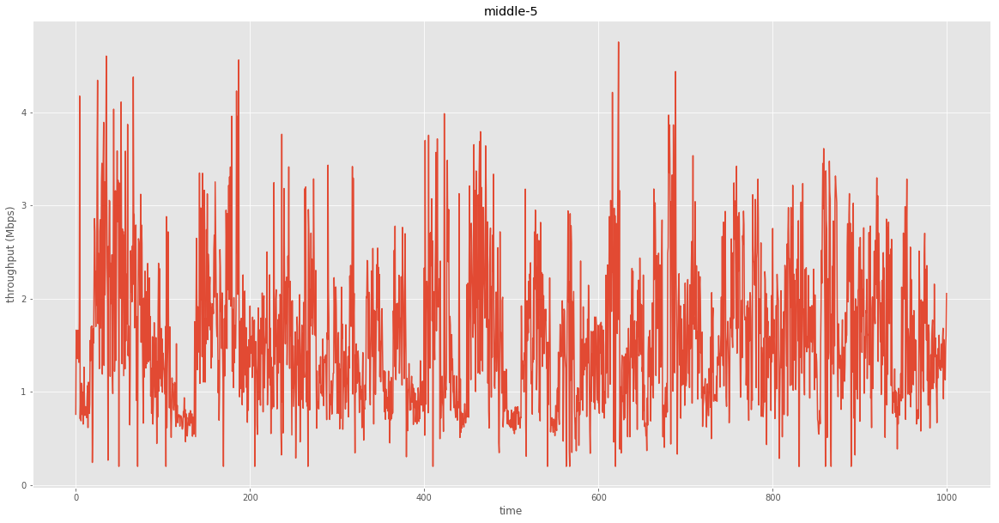

Average: 1.583
Max: 5.066
Min: 0.200
Percentile (5): 0.612
Percentile (20): 0.882
Percentile (50): 1.425
Percentile (80): 2.216
Percentile (95): 3.113


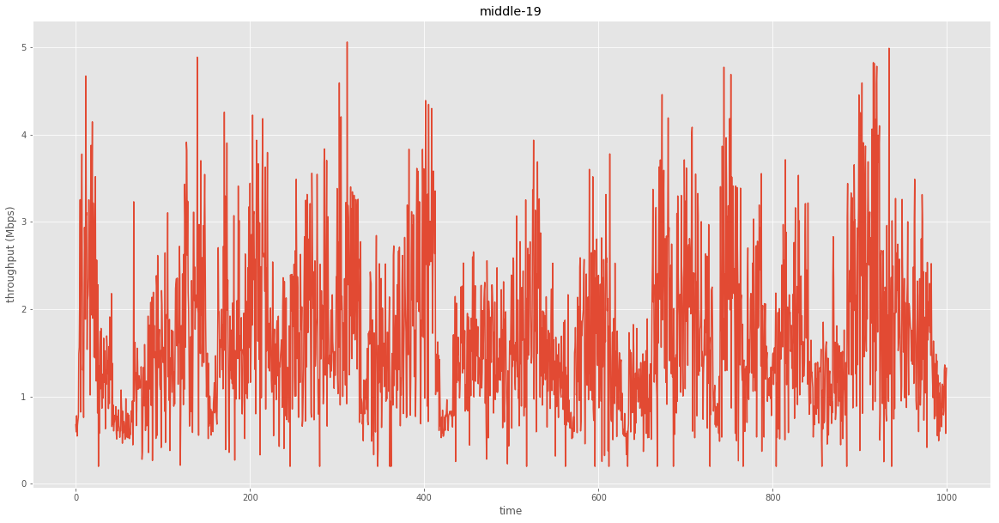

Average: 1.654
Max: 5.508
Min: 0.200
Percentile (5): 0.533
Percentile (20): 0.891
Percentile (50): 1.477
Percentile (80): 2.364
Percentile (95): 3.339


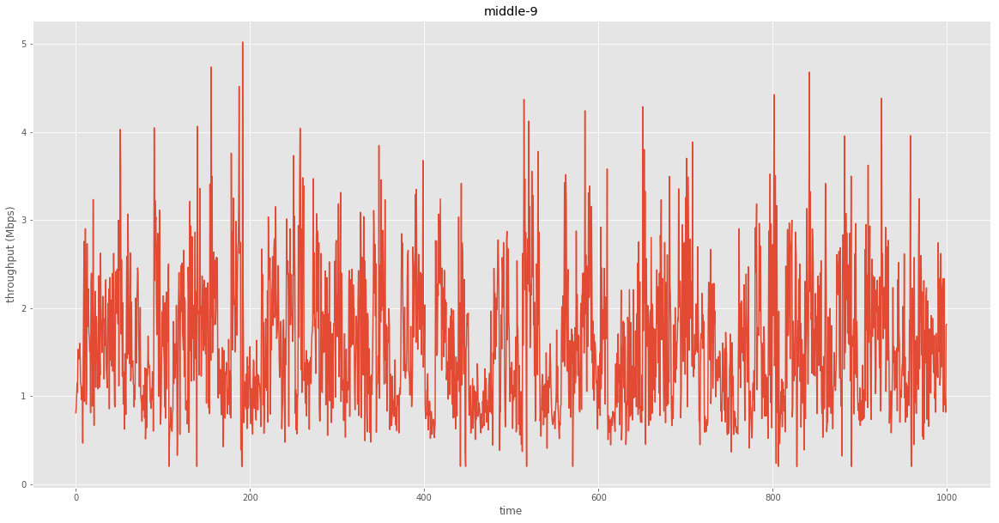

Average: 1.598
Max: 5.529
Min: 0.200
Percentile (5): 0.610
Percentile (20): 0.907
Percentile (50): 1.460
Percentile (80): 2.236
Percentile (95): 3.043


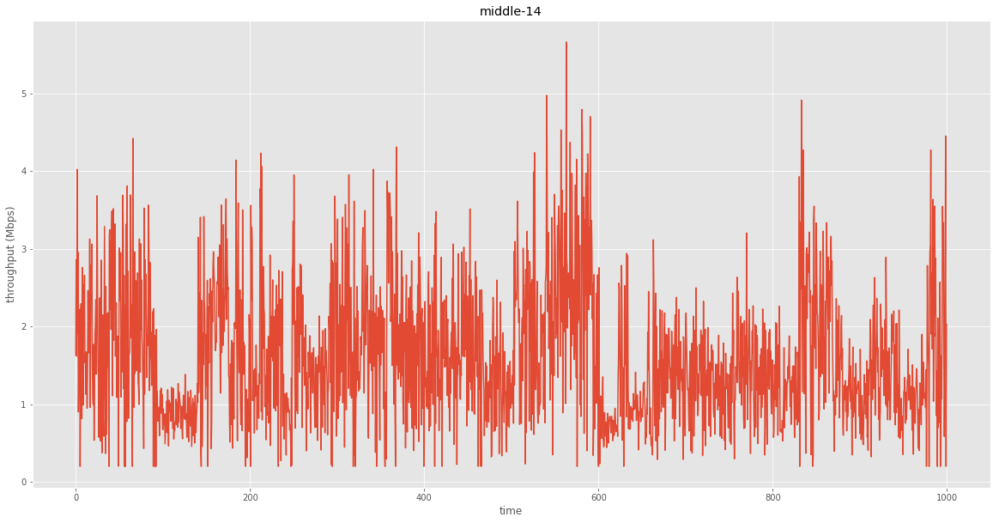

Average: 1.653
Max: 6.190
Min: 0.200
Percentile (5): 0.528
Percentile (20): 0.908
Percentile (50): 1.491
Percentile (80): 2.342
Percentile (95): 3.321


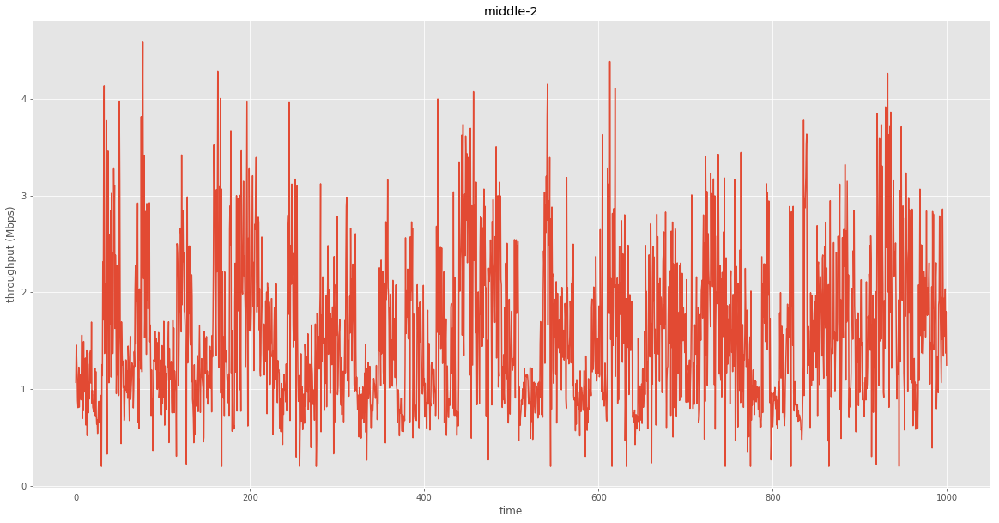

Average: 1.573
Max: 5.117
Min: 0.200
Percentile (5): 0.619
Percentile (20): 0.914
Percentile (50): 1.432
Percentile (80): 2.170
Percentile (95): 3.024


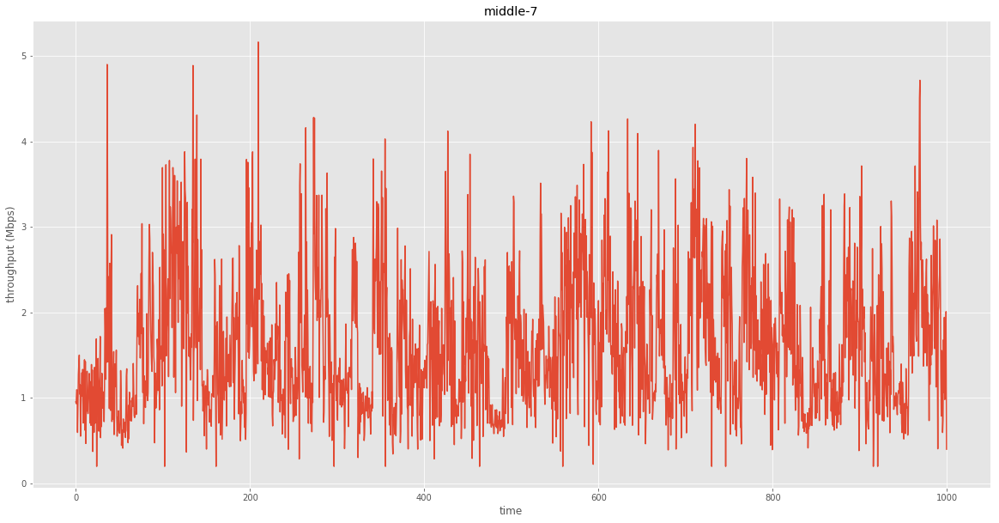

Average: 1.630
Max: 5.164
Min: 0.200
Percentile (5): 0.626
Percentile (20): 0.936
Percentile (50): 1.486
Percentile (80): 2.297
Percentile (95): 3.135


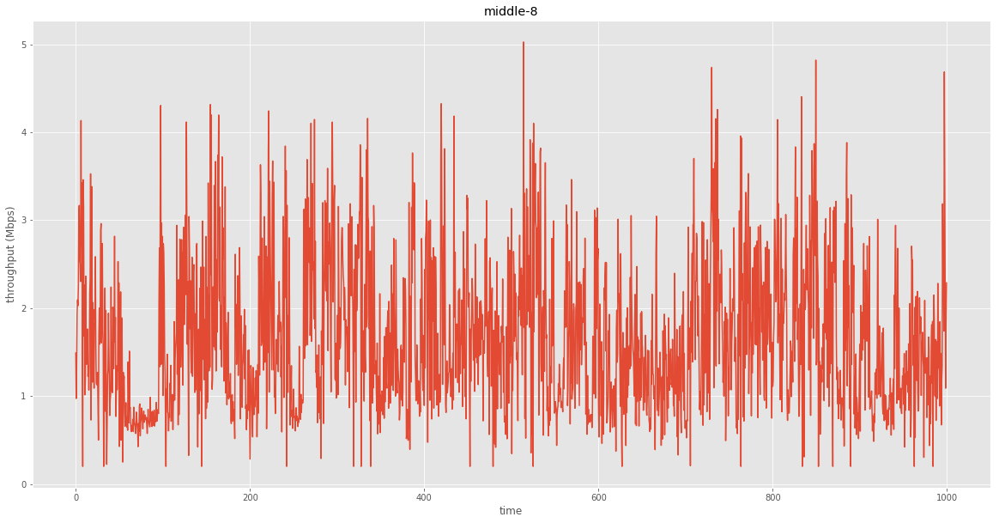

Average: 1.692
Max: 5.218
Min: 0.200
Percentile (5): 0.617
Percentile (20): 0.951
Percentile (50): 1.559
Percentile (80): 2.381
Percentile (95): 3.240


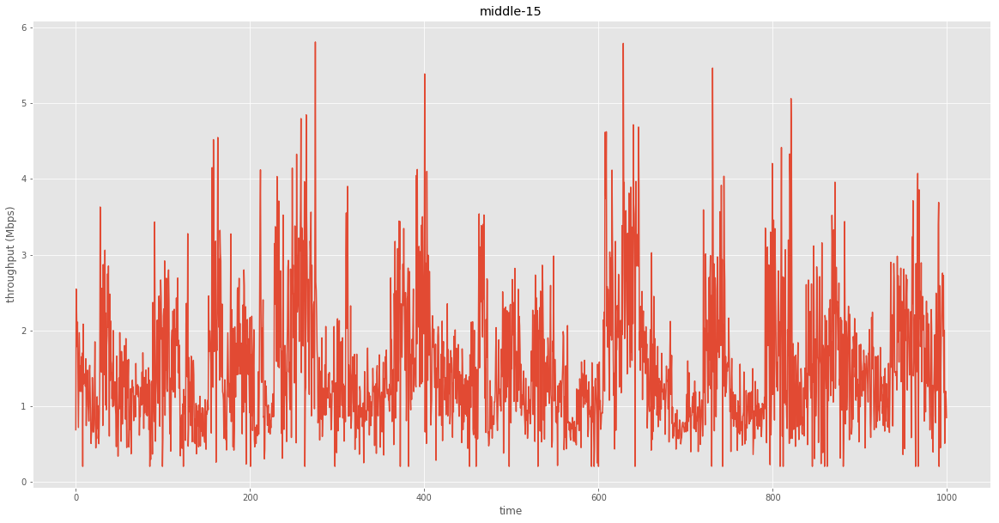

Average: 1.557
Max: 5.812
Min: 0.200
Percentile (5): 0.512
Percentile (20): 0.821
Percentile (50): 1.354
Percentile (80): 2.241
Percentile (95): 3.212


In [6]:
get_analysis_result('network_trace/middle/')

### Weak Network Analysis

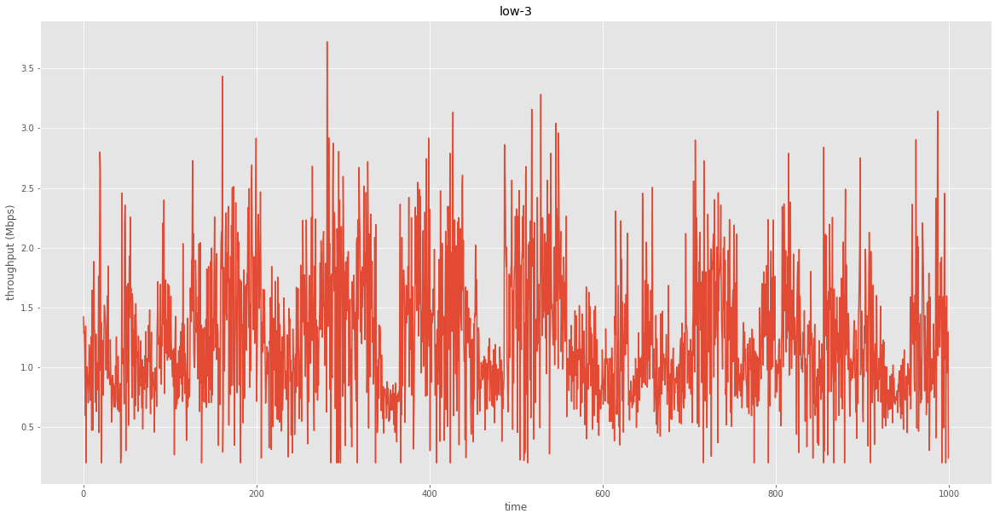

Average: 1.225
Max: 3.724
Min: 0.200
Percentile (5): 0.496
Percentile (20): 0.767
Percentile (50): 1.137
Percentile (80): 1.675
Percentile (95): 2.250


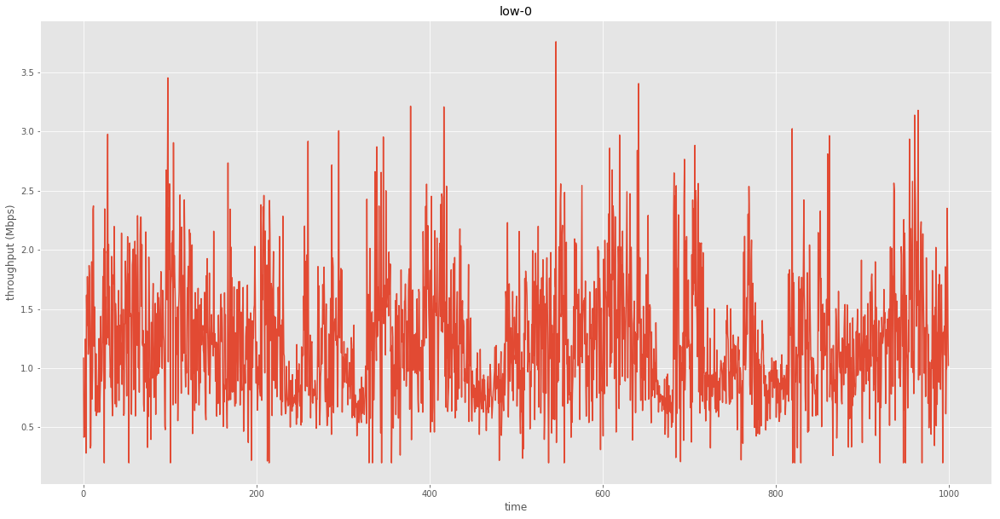

Average: 1.209
Max: 4.215
Min: 0.200
Percentile (5): 0.512
Percentile (20): 0.759
Percentile (50): 1.118
Percentile (80): 1.635
Percentile (95): 2.207


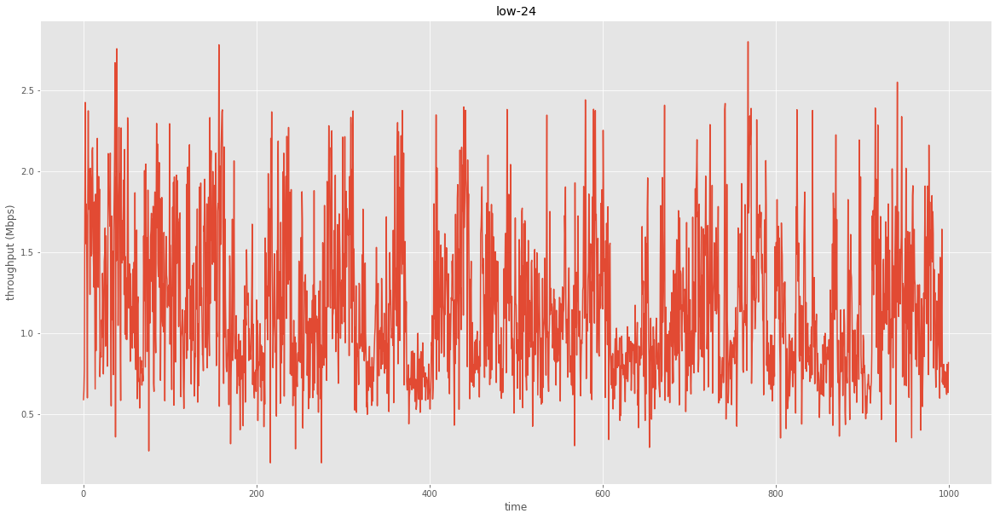

Average: 1.174
Max: 3.184
Min: 0.200
Percentile (5): 0.589
Percentile (20): 0.772
Percentile (50): 1.069
Percentile (80): 1.574
Percentile (95): 2.078


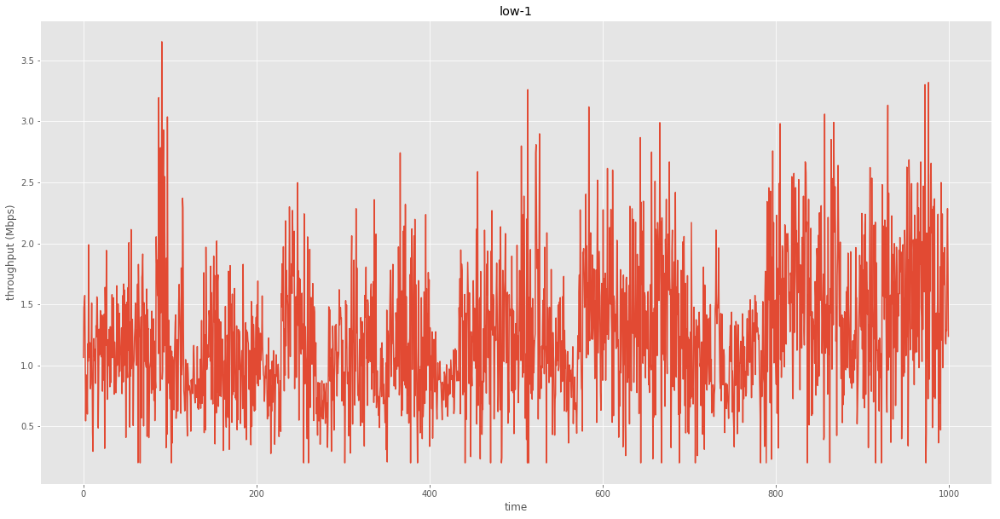

Average: 1.217
Max: 3.821
Min: 0.200
Percentile (5): 0.505
Percentile (20): 0.760
Percentile (50): 1.125
Percentile (80): 1.643
Percentile (95): 2.241


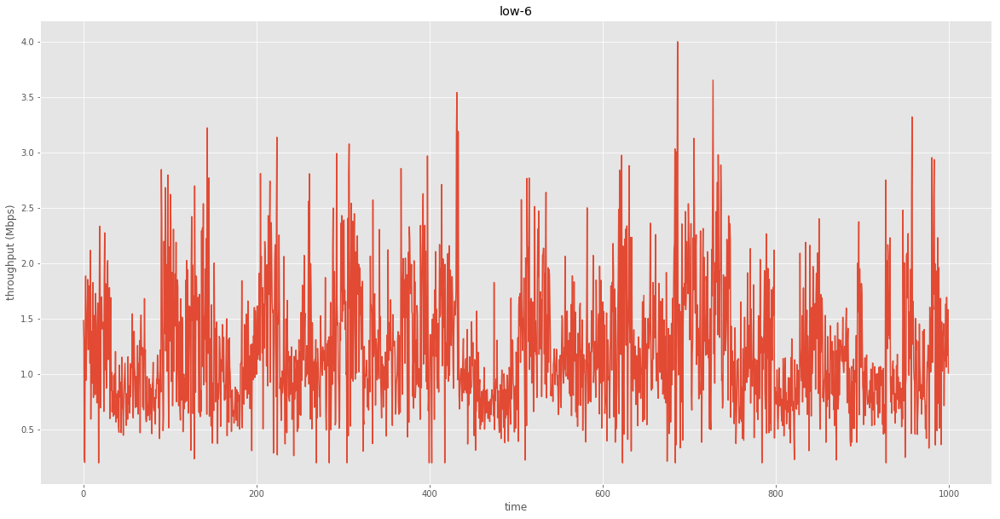

Average: 1.193
Max: 4.004
Min: 0.200
Percentile (5): 0.504
Percentile (20): 0.761
Percentile (50): 1.089
Percentile (80): 1.604
Percentile (95): 2.191


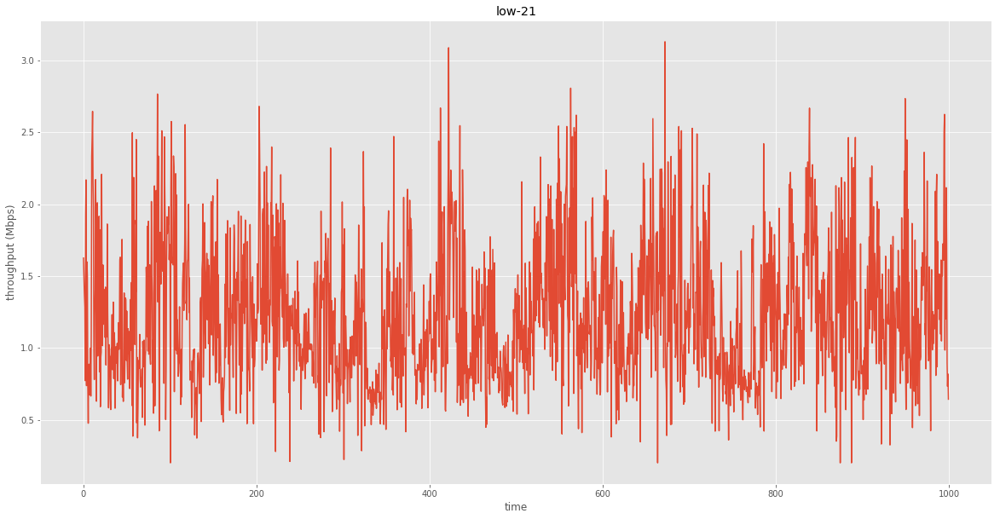

Average: 1.228
Max: 3.212
Min: 0.200
Percentile (5): 0.597
Percentile (20): 0.819
Percentile (50): 1.145
Percentile (80): 1.616
Percentile (95): 2.135


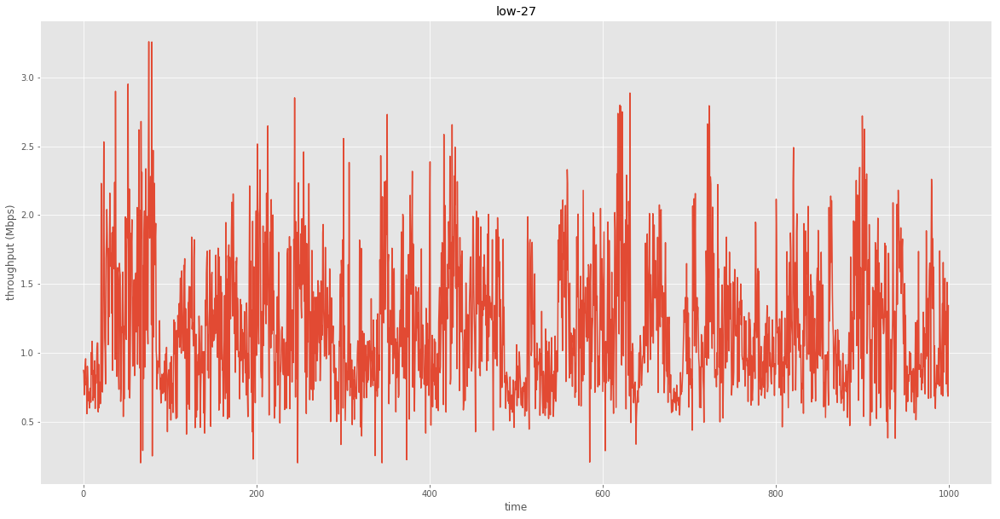

Average: 1.166
Max: 3.296
Min: 0.200
Percentile (5): 0.591
Percentile (20): 0.775
Percentile (50): 1.080
Percentile (80): 1.523
Percentile (95): 2.041


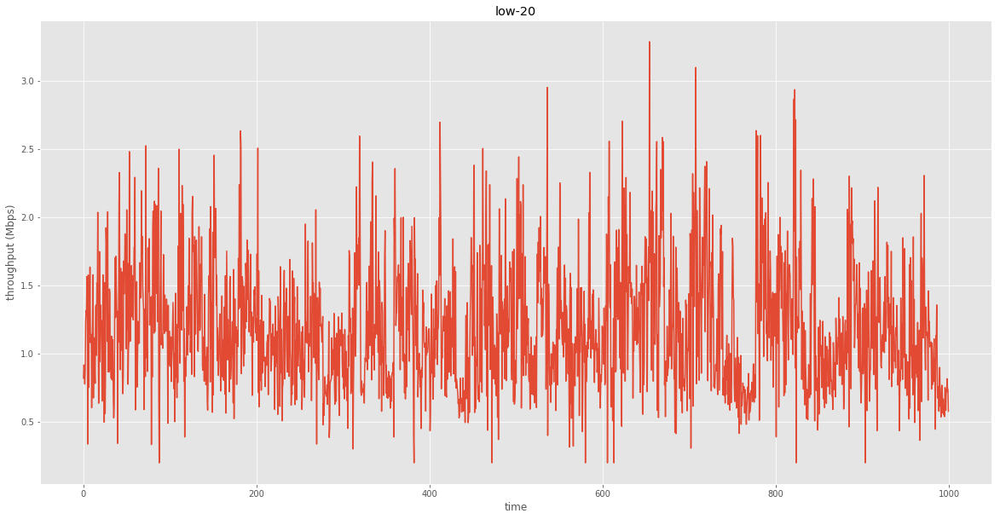

Average: 1.178
Max: 3.623
Min: 0.200
Percentile (5): 0.587
Percentile (20): 0.782
Percentile (50): 1.101
Percentile (80): 1.536
Percentile (95): 2.036


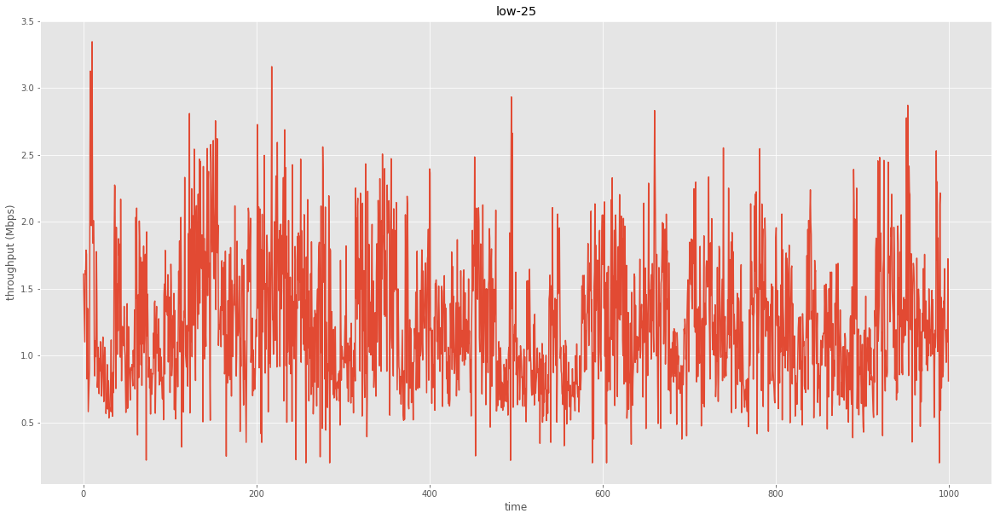

Average: 1.210
Max: 3.537
Min: 0.200
Percentile (5): 0.593
Percentile (20): 0.804
Percentile (50): 1.114
Percentile (80): 1.596
Percentile (95): 2.134


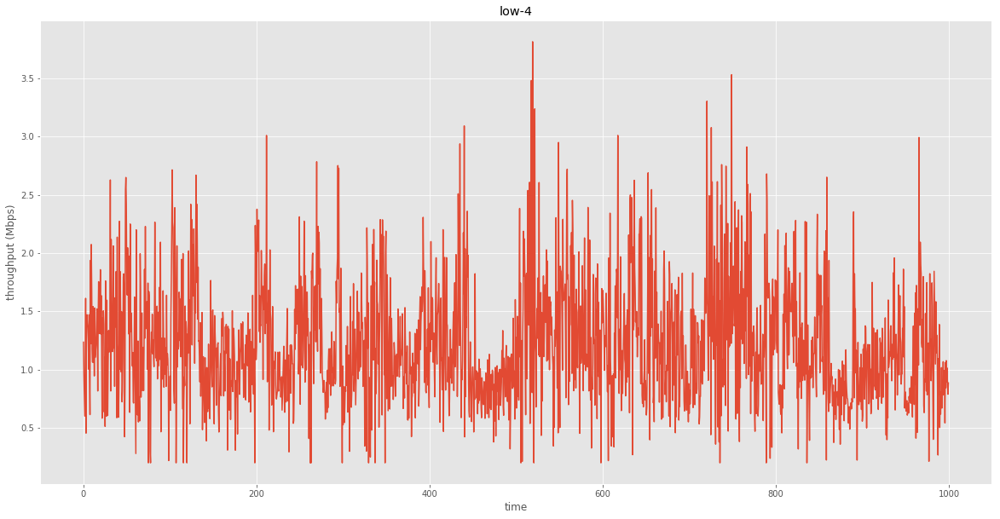

Average: 1.201
Max: 3.940
Min: 0.200
Percentile (5): 0.513
Percentile (20): 0.778
Percentile (50): 1.115
Percentile (80): 1.605
Percentile (95): 2.167


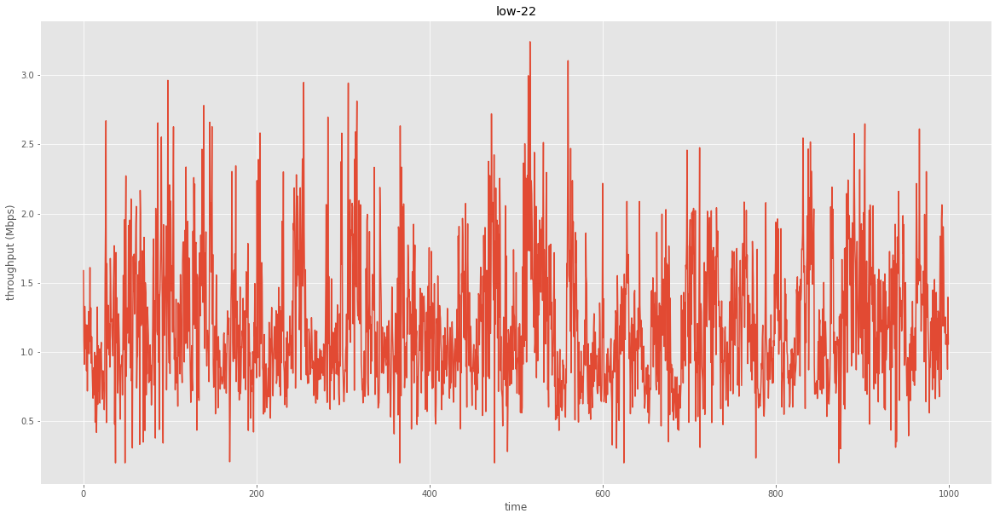

Average: 1.190
Max: 3.242
Min: 0.200
Percentile (5): 0.589
Percentile (20): 0.797
Percentile (50): 1.096
Percentile (80): 1.571
Percentile (95): 2.084


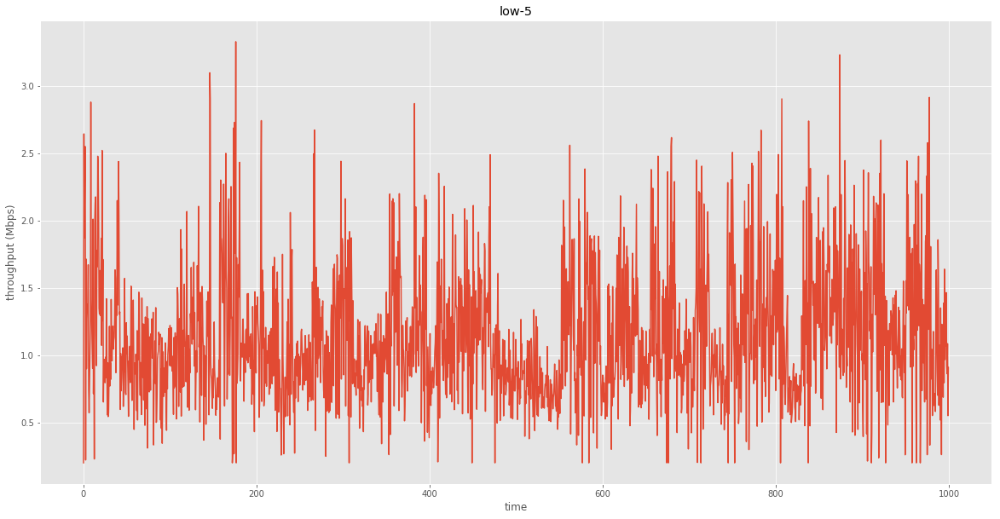

Average: 1.195
Max: 3.559
Min: 0.200
Percentile (5): 0.518
Percentile (20): 0.758
Percentile (50): 1.093
Percentile (80): 1.600
Percentile (95): 2.214


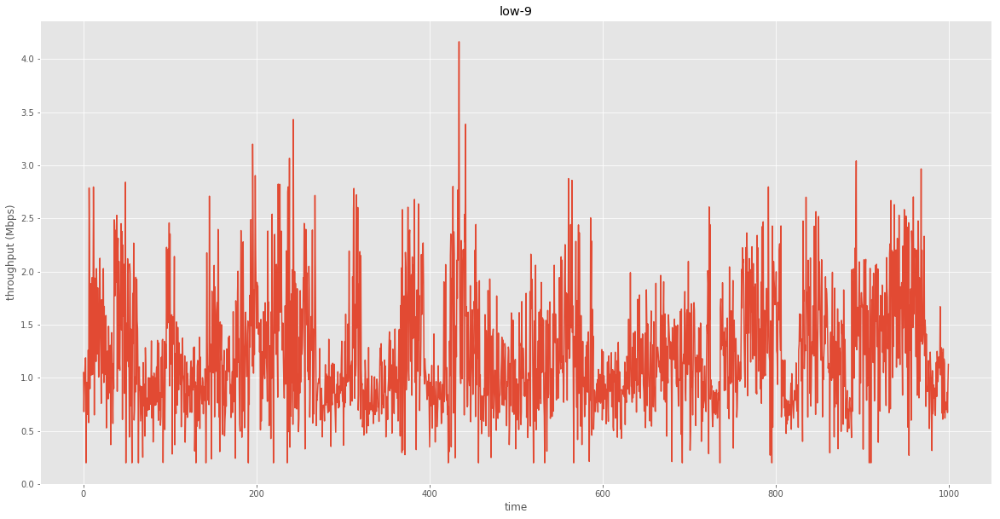

Average: 1.194
Max: 4.164
Min: 0.200
Percentile (5): 0.514
Percentile (20): 0.758
Percentile (50): 1.089
Percentile (80): 1.617
Percentile (95): 2.199


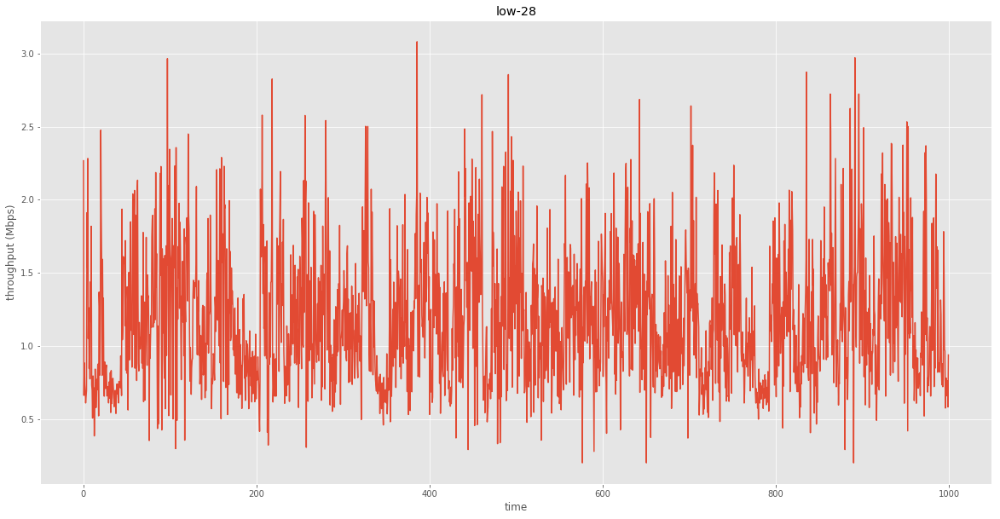

Average: 1.198
Max: 3.422
Min: 0.200
Percentile (5): 0.606
Percentile (20): 0.793
Percentile (50): 1.108
Percentile (80): 1.576
Percentile (95): 2.071


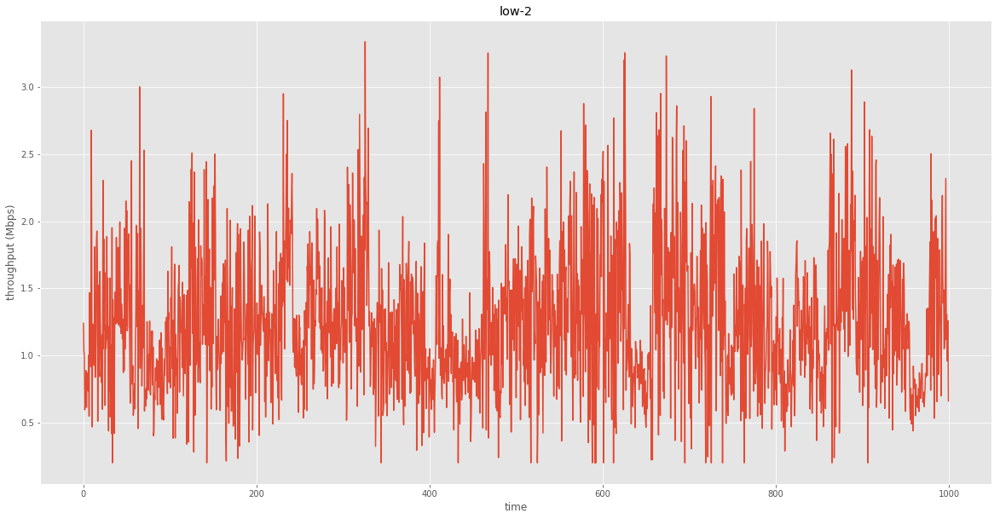

Average: 1.224
Max: 3.978
Min: 0.200
Percentile (5): 0.518
Percentile (20): 0.762
Percentile (50): 1.138
Percentile (80): 1.655
Percentile (95): 2.245


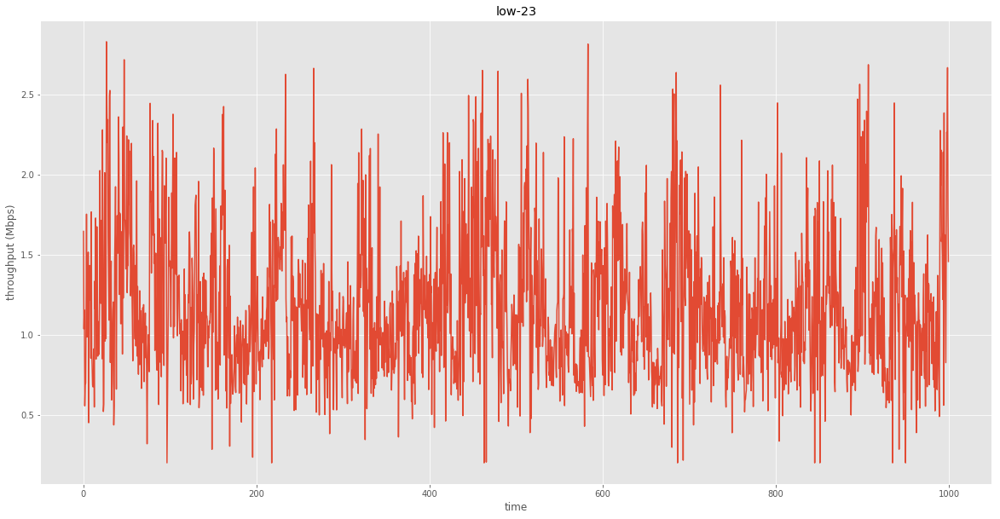

Average: 1.199
Max: 3.507
Min: 0.200
Percentile (5): 0.596
Percentile (20): 0.798
Percentile (50): 1.120
Percentile (80): 1.565
Percentile (95): 2.083


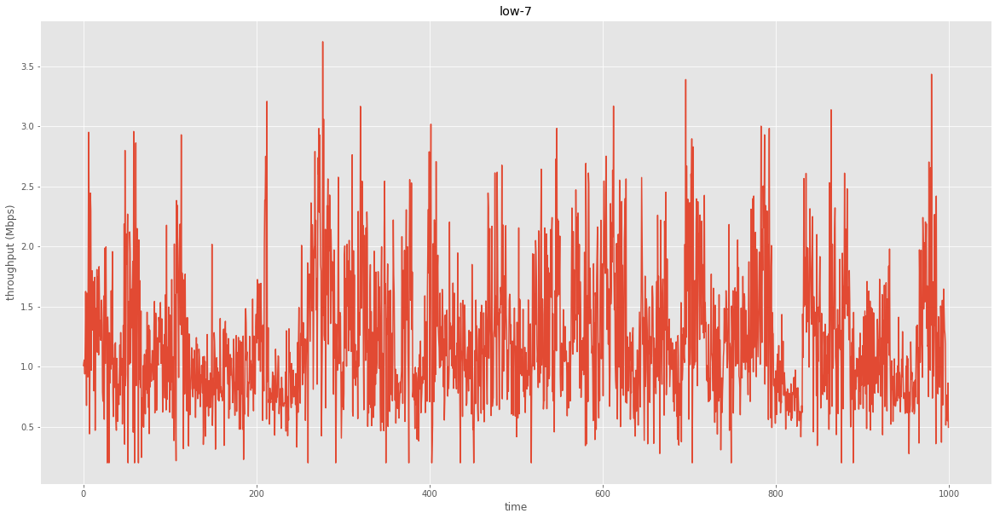

Average: 1.190
Max: 3.703
Min: 0.200
Percentile (5): 0.514
Percentile (20): 0.759
Percentile (50): 1.085
Percentile (80): 1.599
Percentile (95): 2.202


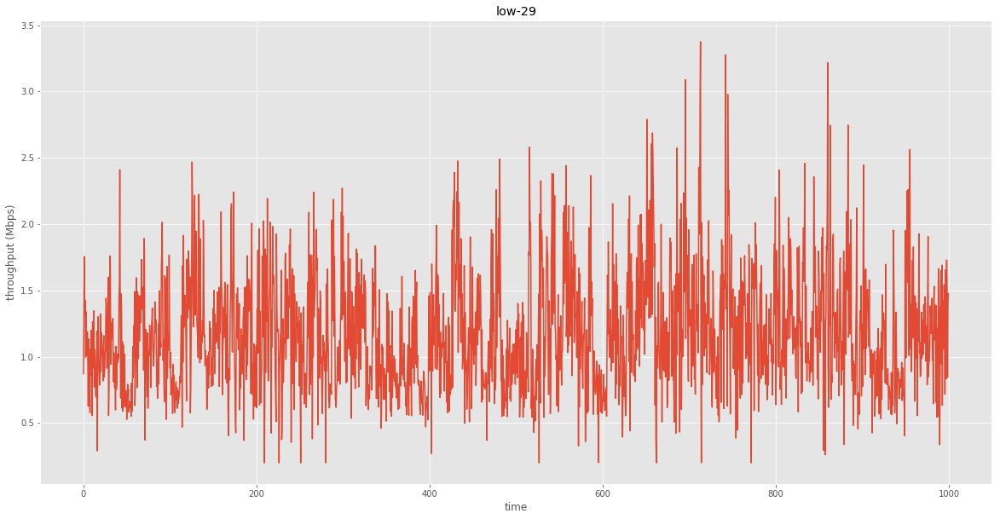

Average: 1.184
Max: 3.501
Min: 0.200
Percentile (5): 0.585
Percentile (20): 0.792
Percentile (50): 1.106
Percentile (80): 1.551
Percentile (95): 2.045


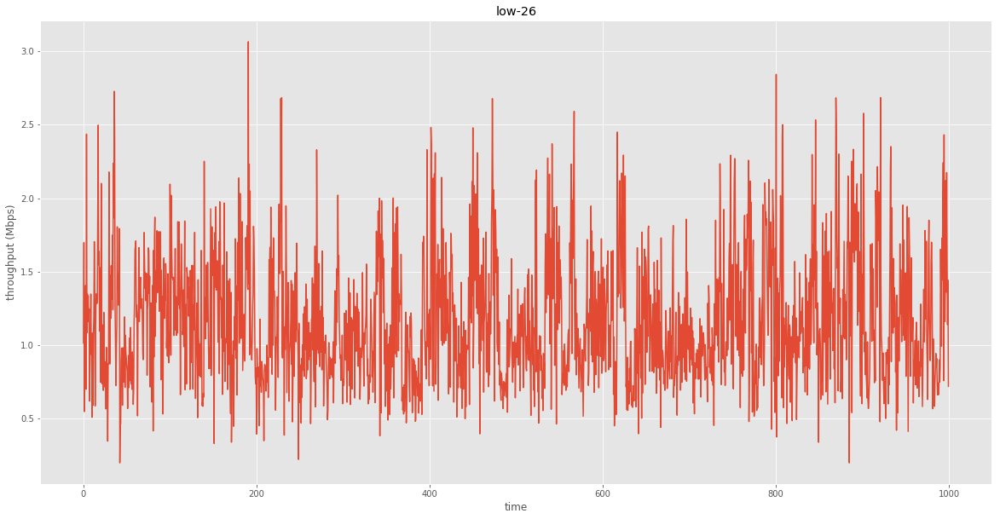

Average: 1.169
Max: 3.262
Min: 0.200
Percentile (5): 0.583
Percentile (20): 0.790
Percentile (50): 1.094
Percentile (80): 1.527
Percentile (95): 2.013


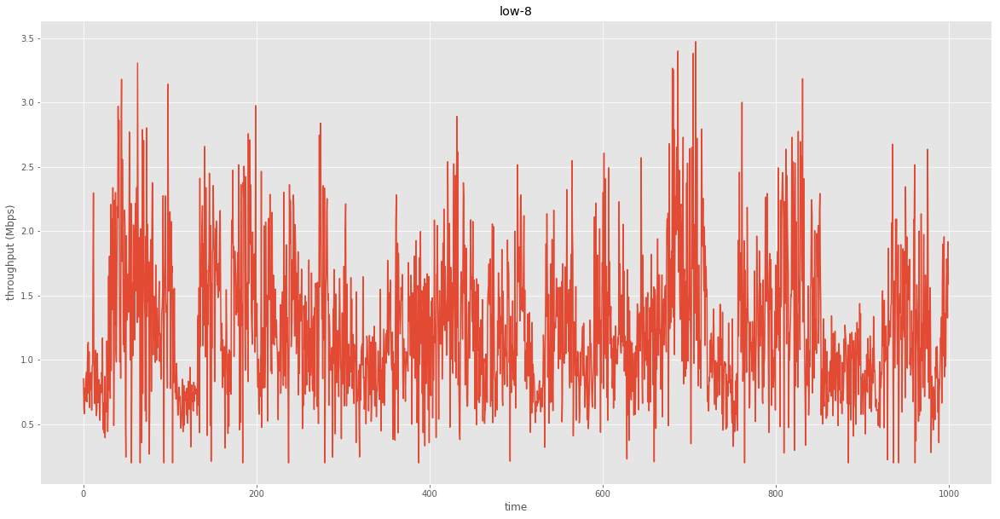

Average: 1.219
Max: 3.664
Min: 0.200
Percentile (5): 0.500
Percentile (20): 0.760
Percentile (50): 1.119
Percentile (80): 1.637
Percentile (95): 2.253


In [7]:
get_analysis_result('network_trace/low/')

## Video Trace Analysis
This trace contains the time and size of each frame captured on CDN. The format is:

| Timestamp (s)  | Frame Data Size (bit) | Is_I_frame_flag (0/1) |
| :---: | :---: | :---: |
| 00.0013  | 147800  | 1  |
| 00.0037  | 272301  | 0  |
| ...  | ...  | ...  |

In [24]:
def plot_frame_size(trace_file, title, LEN):
    frame_sizes = []
    frame_flags = []
    with open(trace_file, 'rb') as f:
        for line in f:
            parse = line.split()
            frame_sizes.append(float(parse[1]))
            frame_flags.append(int(parse[2]))
            
    frame_sizes = np.array(frame_sizes[:LEN])
    frame_flags = np.array(frame_flags[:LEN])
#     Iframes = np.argwhere(frame_flags)
#     Iframes = np.flatnonzero(frame_flags)
#     Iframes_size = 1
#     for dim in Iframes.shape:
#         Iframes_size *= dim
#     np.reshape(Iframes, Iframes_size)
#     print(Iframes)
               
    fig = plt.figure(figsize=(20,6))
    plt.plot(frame_sizes, marker='*', markersize=10, markevery=50)
    plt.xlabel('frame No.')
    plt.ylabel('frame data size (bit)')
    plt.title(title)
    plt.show()

In [25]:
def plot_gop_size(trace_file, title):
    gop_sizes = []
    with open(trace_file, 'rb') as f:
        gop_size = 0.0
        for line in f:
            parse = line.split()
#             print(parse)
            if int(parse[2]) == 1:
                gop_sizes.append(gop_size)
#                 print(gop_size)
                gop_size = float(parse[1])
            else:
                gop_size += float(parse[1])
    
    gop_sizes = np.array(gop_sizes) / 1000000
    
    fig = plt.figure(figsize=(20,6))
    plt.plot(gop_sizes)
    plt.xlabel('Gop No.')
    plt.ylabel('Gop data size (Mbits)')
    plt.title(title)
    plt.show()

In [26]:
def get_analysis_result_video(path, flag, LEN):
    for root, dirnames, filenames in os.walk(os.path.abspath(path)):
        for filename in filenames:
            trace_file = os.path.join(root, filename)
            parse = trace_file.split('/')
            title = parse[-2] + '-' + parse[-1][-1]
            if flag == 'gop':
                plot_gop_size(trace_file, title)
            elif flag == 'frame':
                plot_frame_size(trace_file, title, LEN)
            else:
                print('please check input of flag, only two choices: gop or flag')

## Game

### Frame level analysis

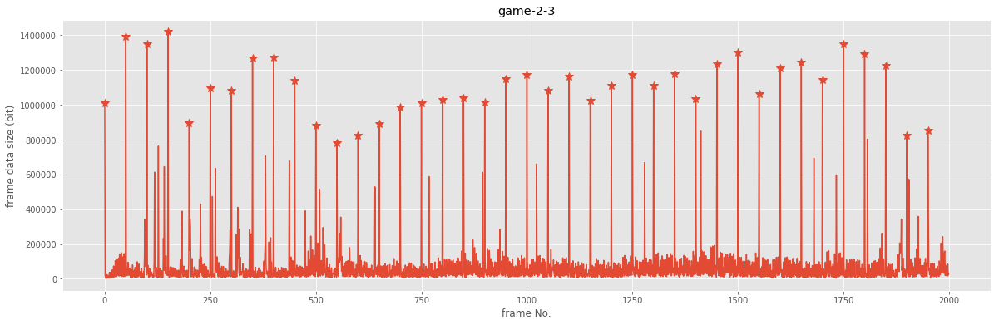

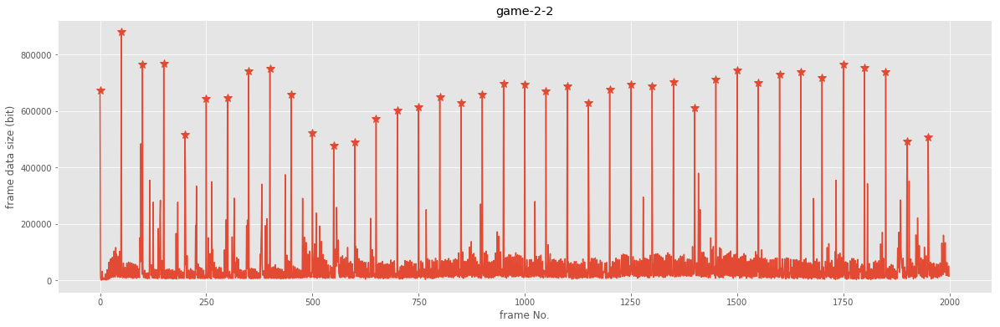

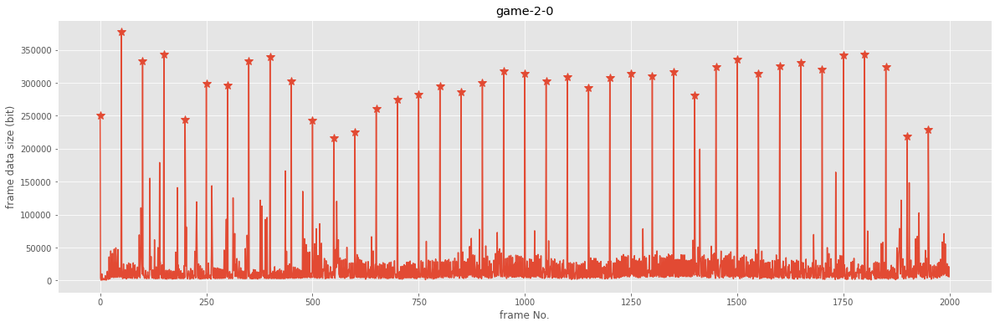

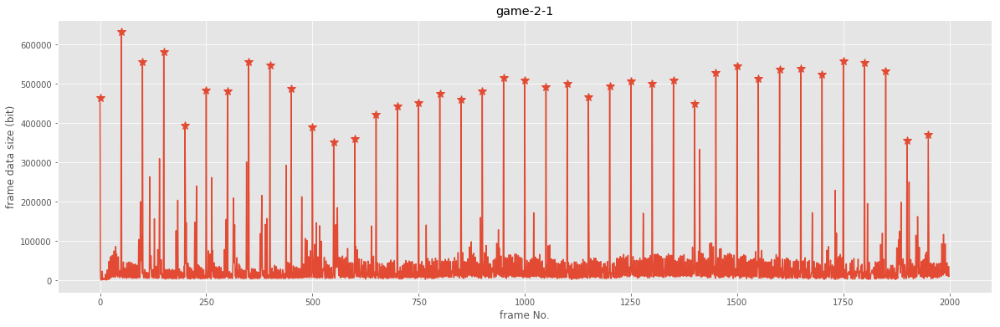

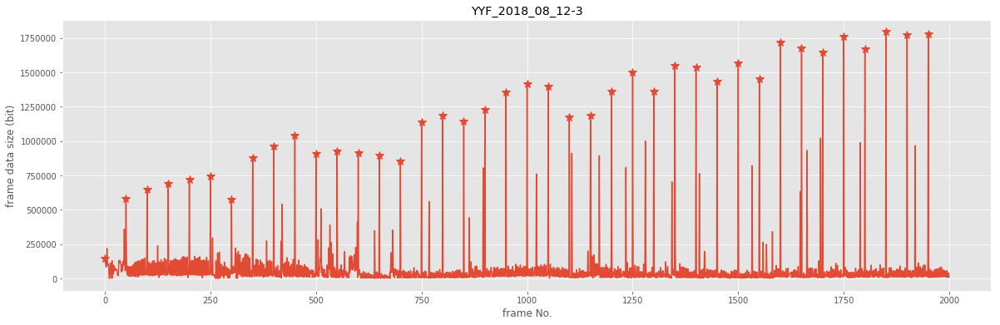

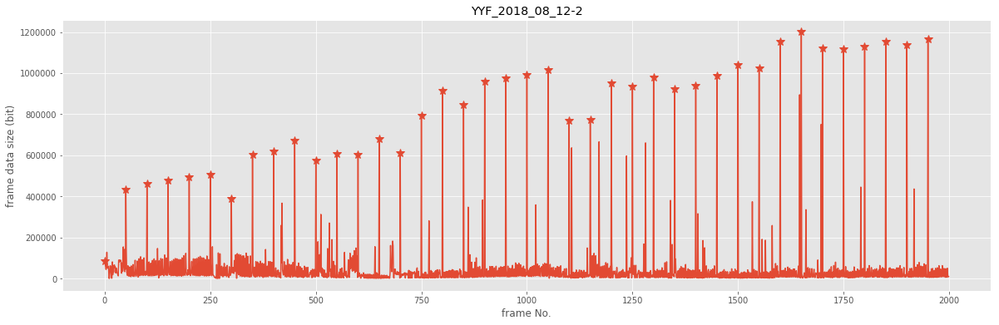

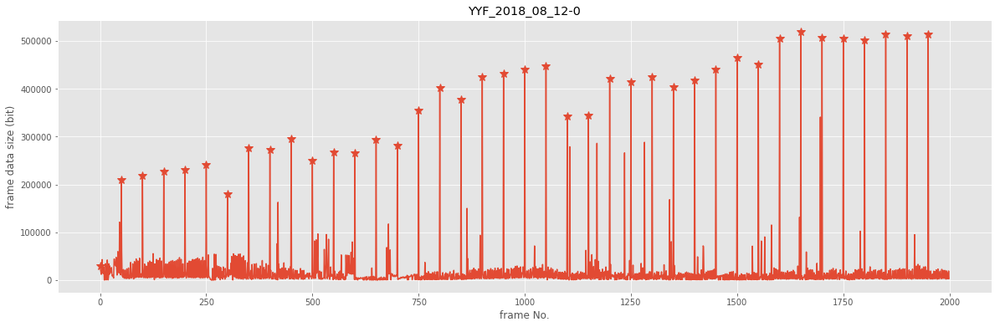

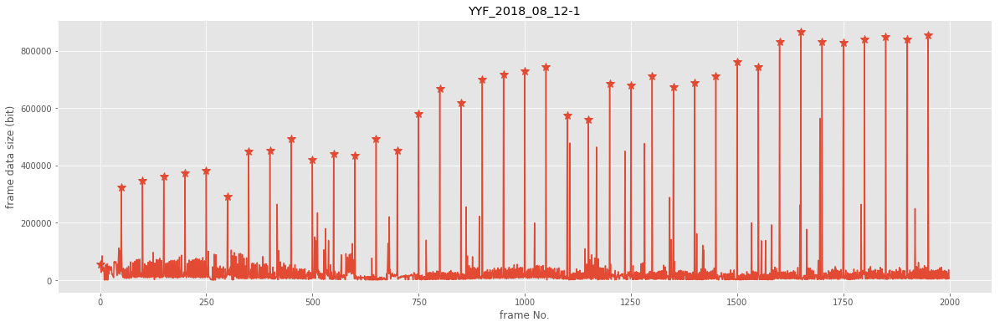

In [33]:
get_analysis_result_video('video_trace/game/', 'frame', 2000)

### Gop level analysis

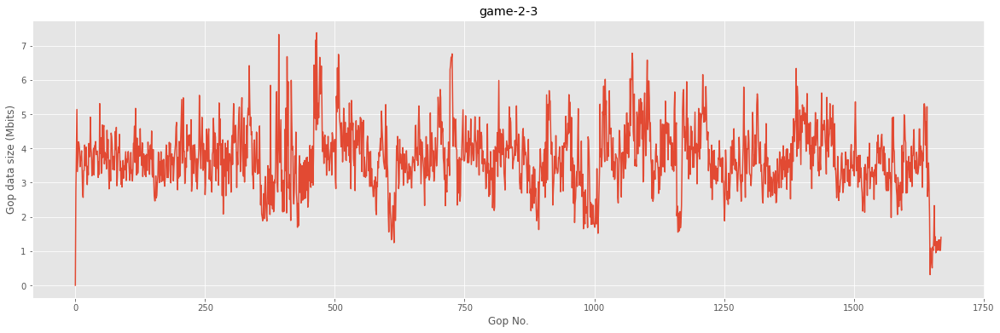

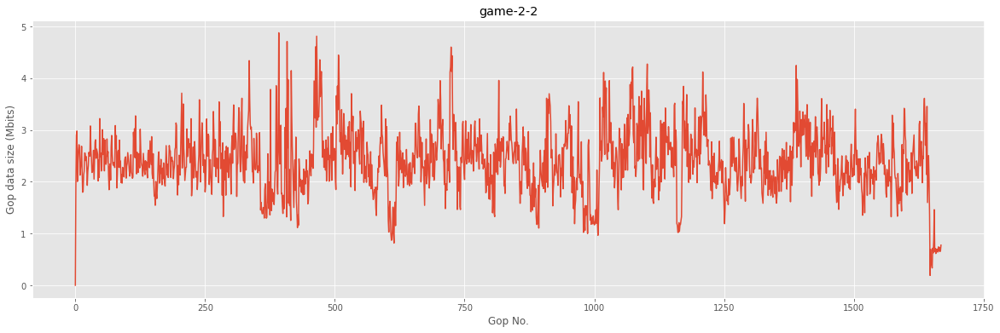

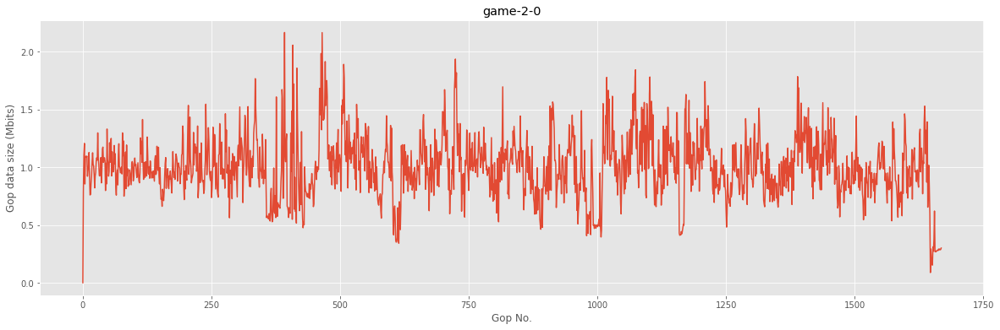

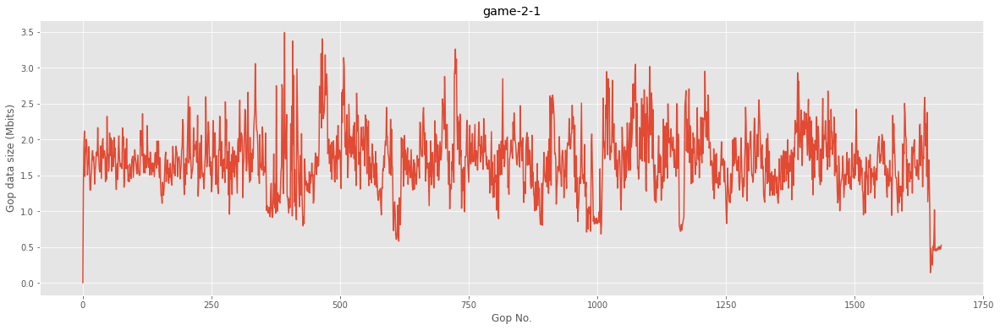

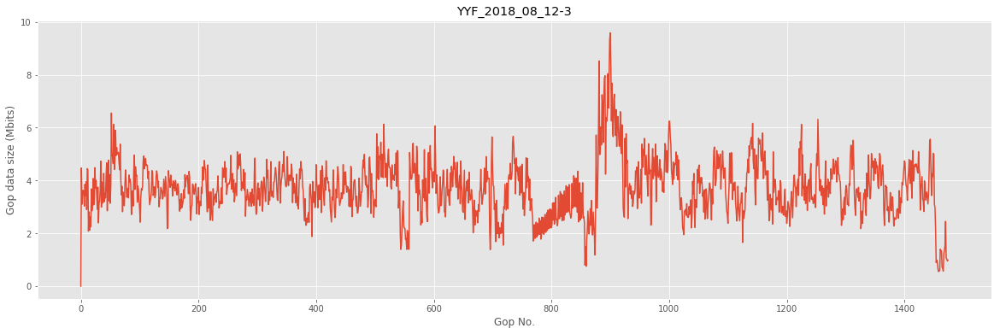

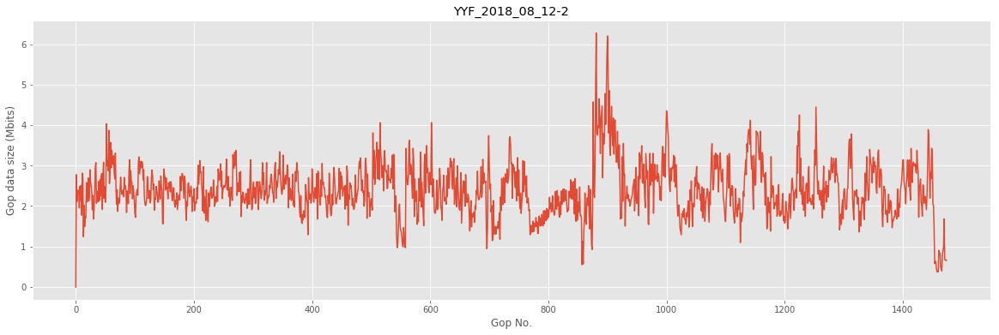

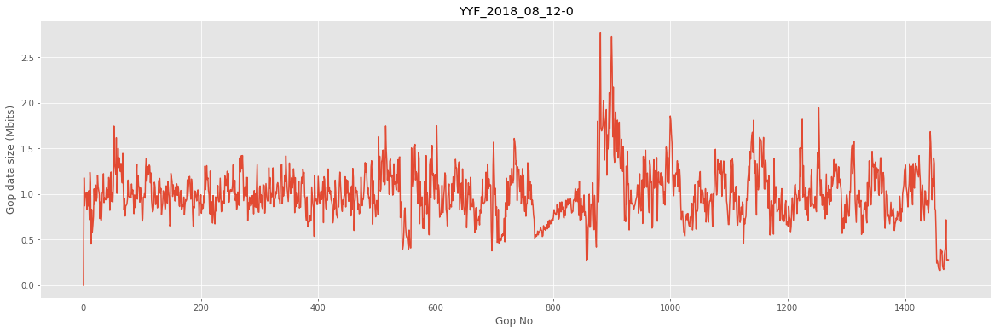

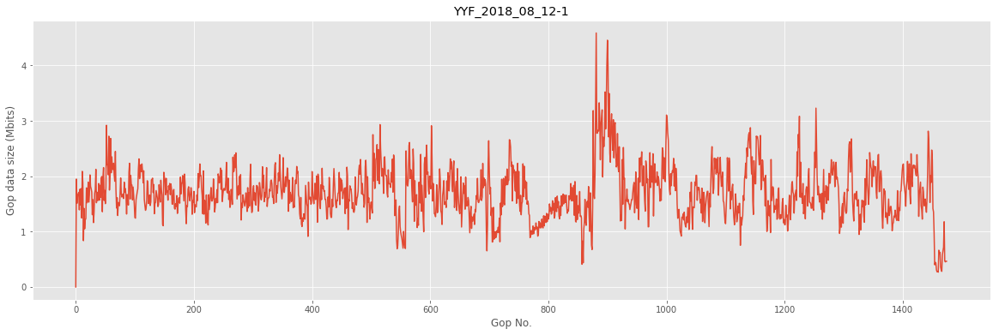

In [34]:
get_analysis_result_video('video_trace/game/', 'gop', 0)

## Room

### Frame level analysis

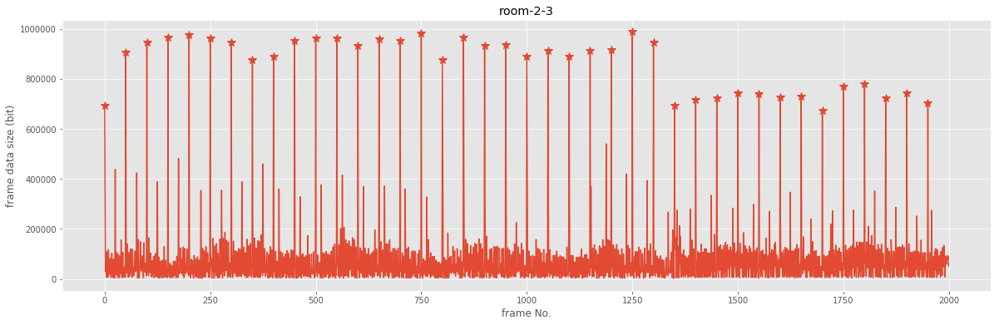

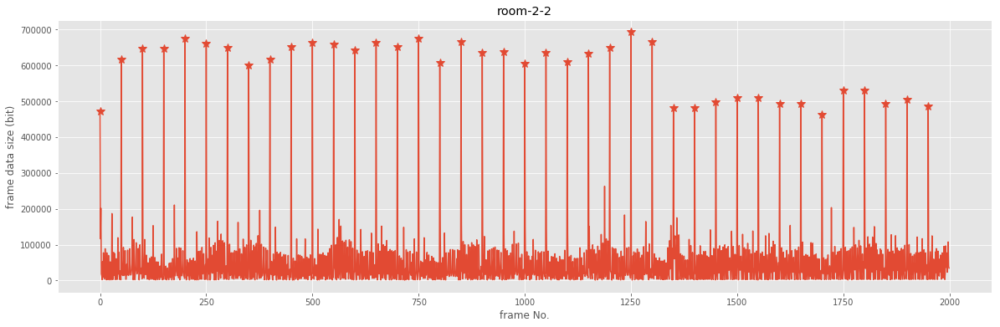

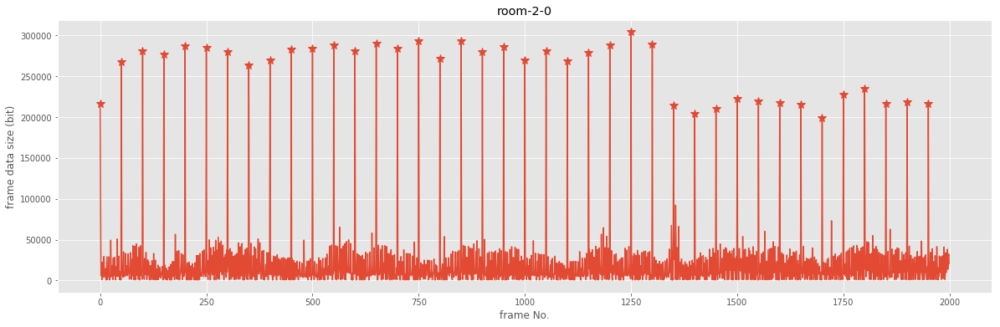

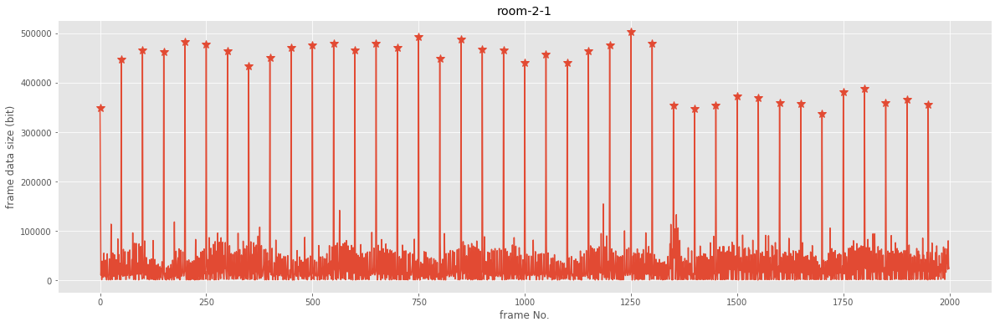

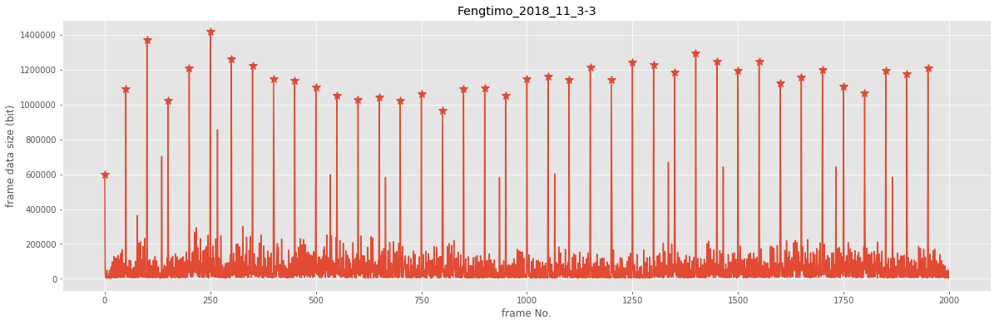

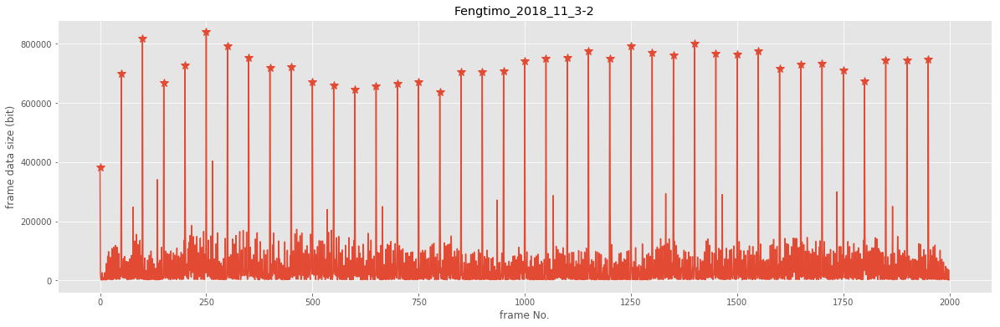

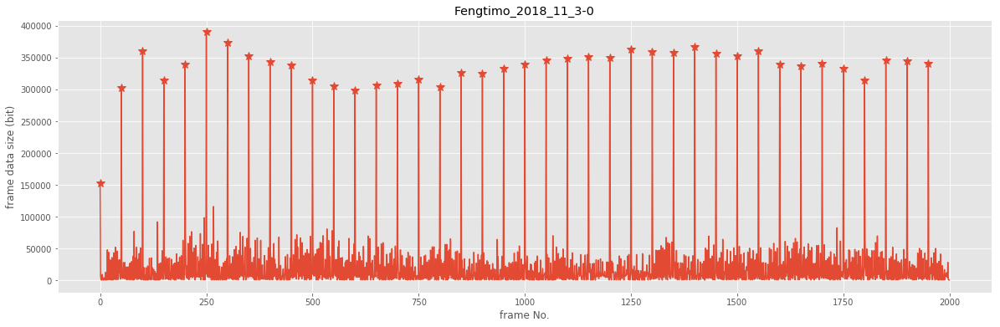

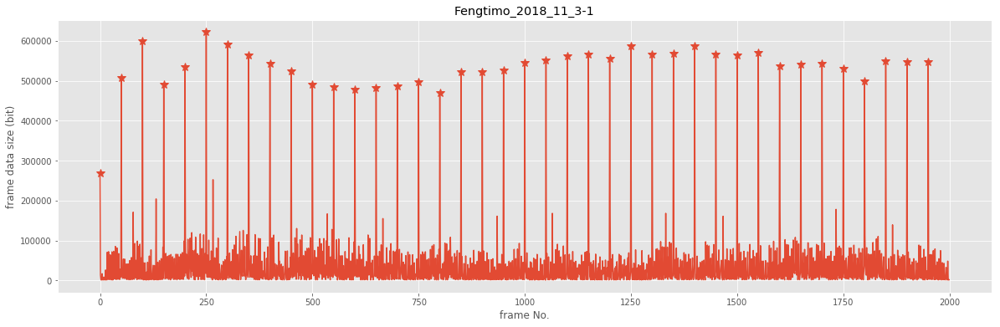

In [35]:
get_analysis_result_video('video_trace/room/', 'frame', 2000)

### Gop level analysis

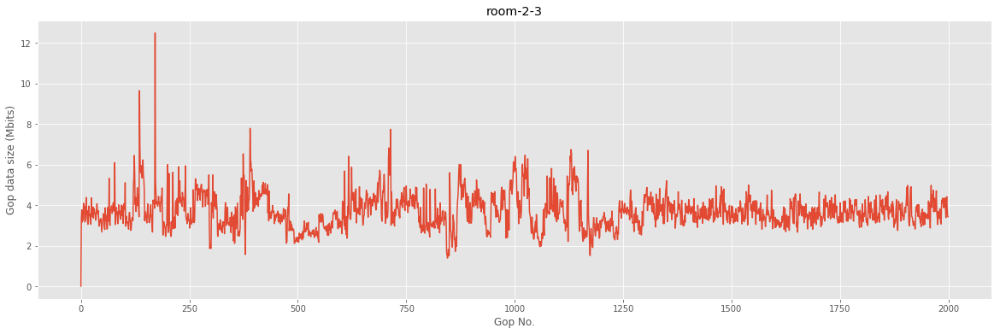

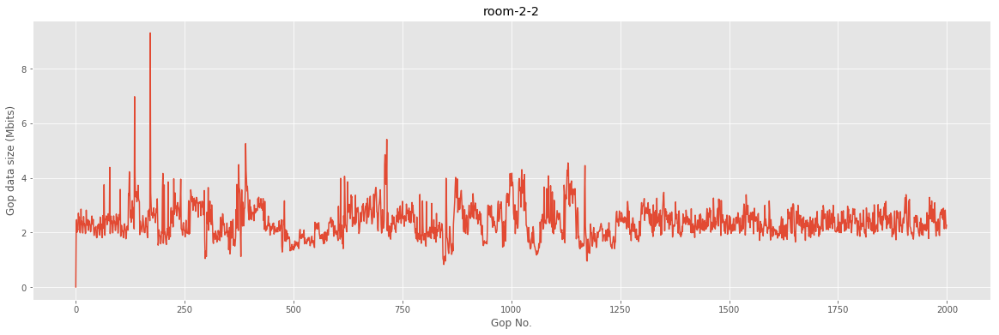

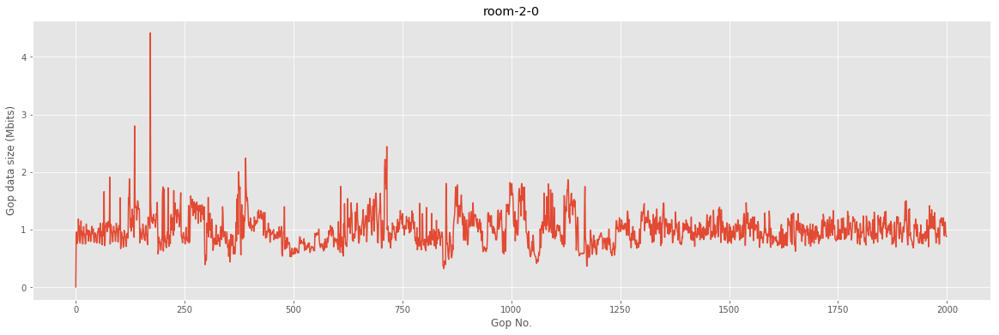

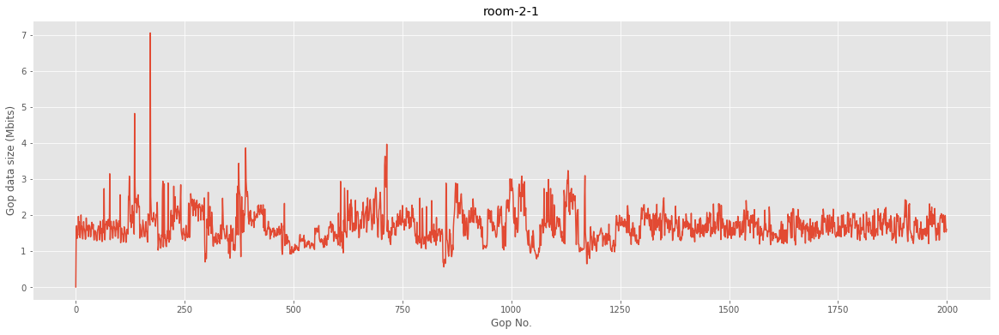

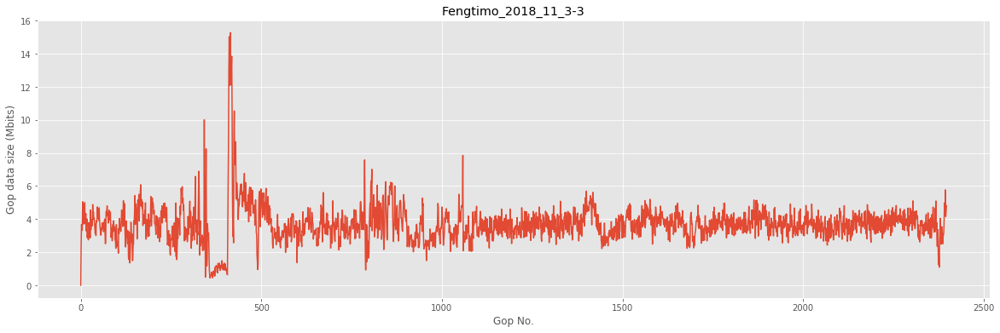

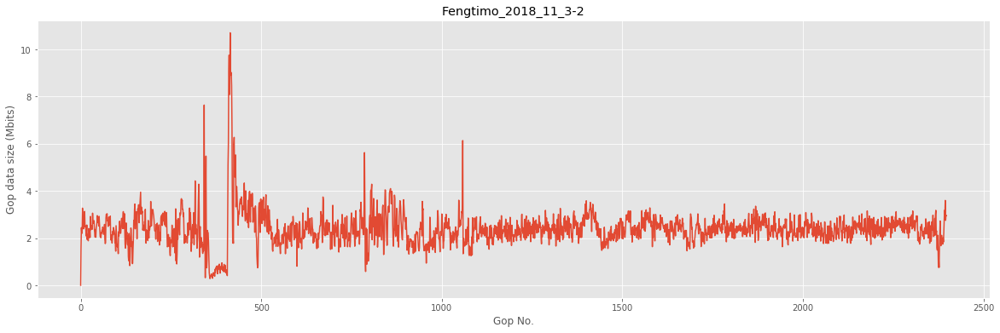

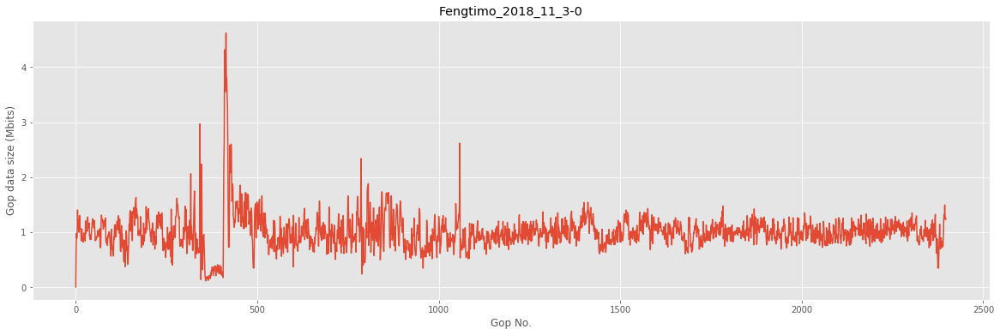

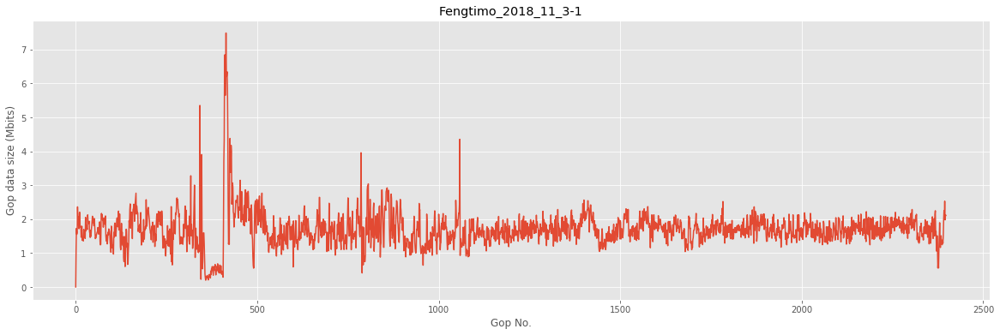

In [36]:
get_analysis_result_video('video_trace/room/', 'gop', 0)

## Sports

### Frame level analysis

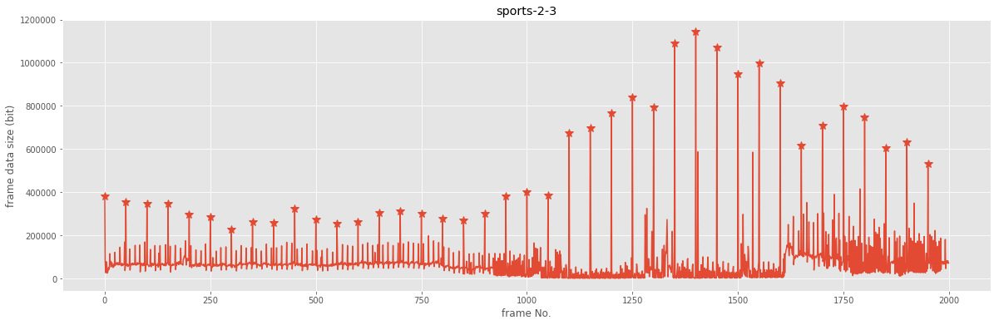

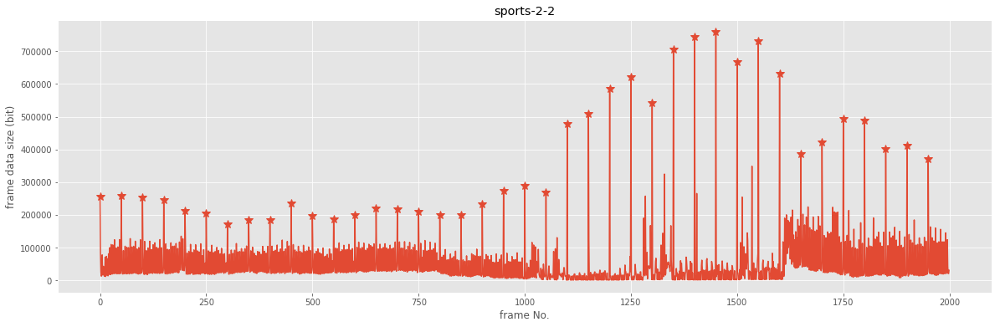

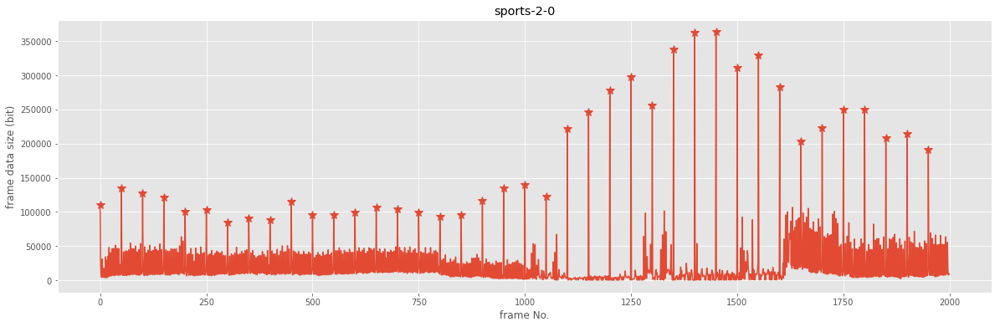

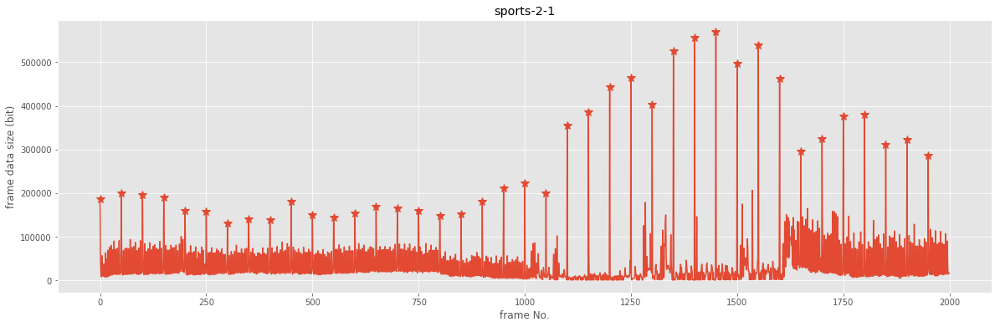

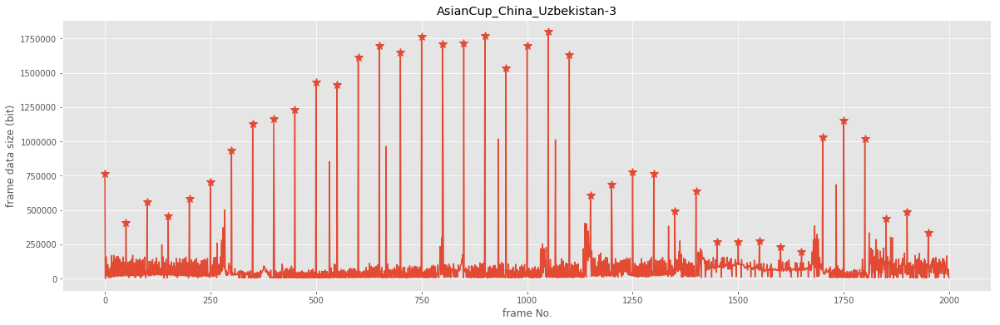

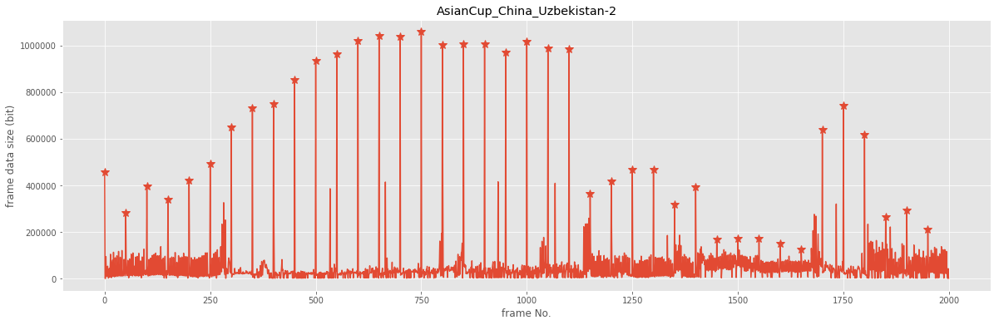

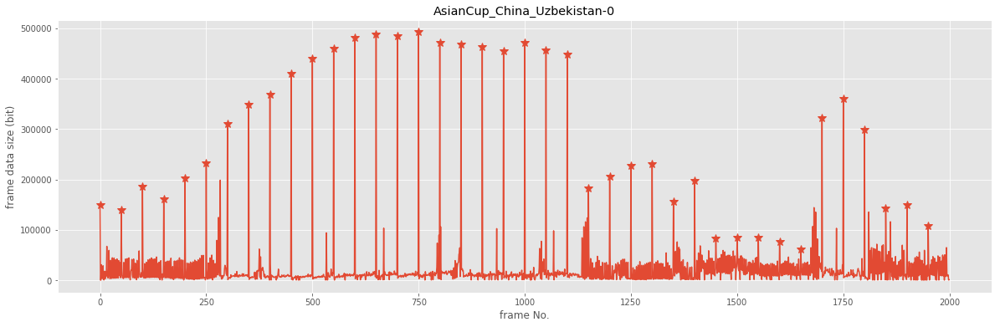

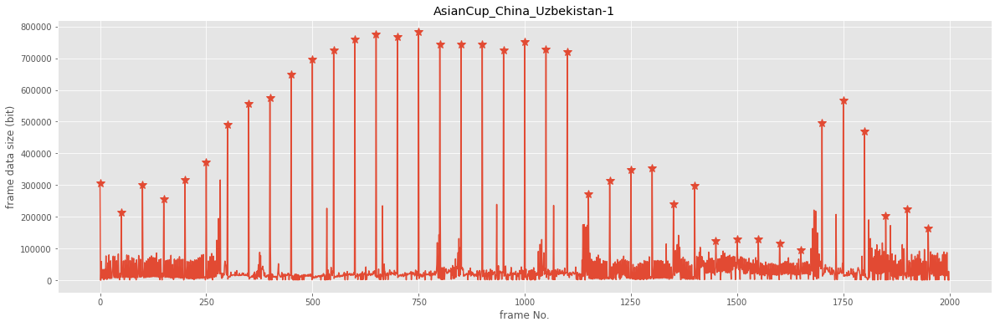

In [37]:
get_analysis_result_video('video_trace/sports/', 'frame', 2000)

### Gop level analysis

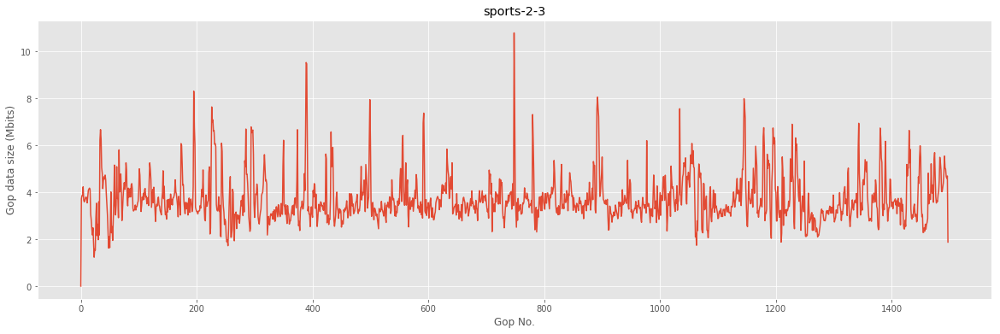

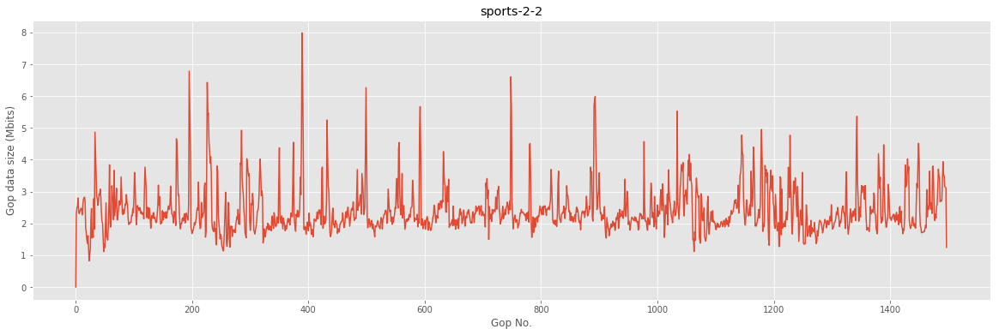

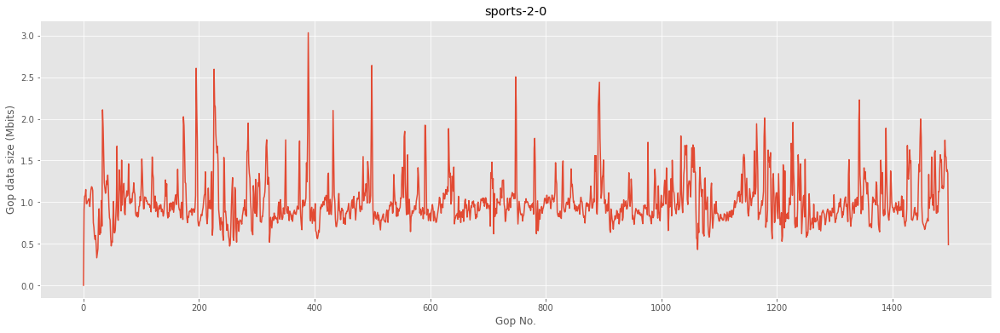

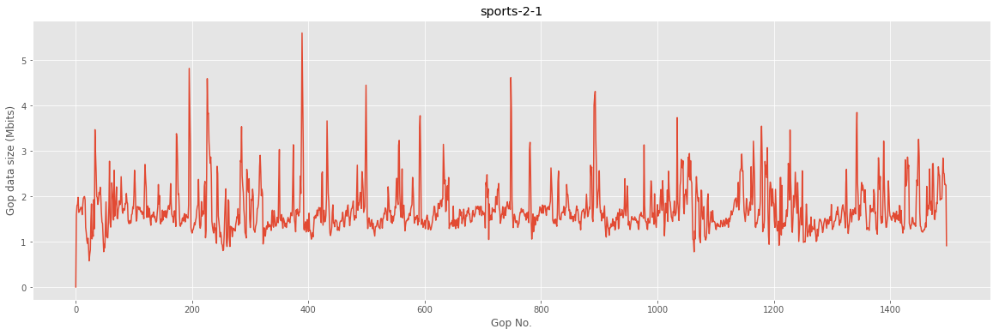

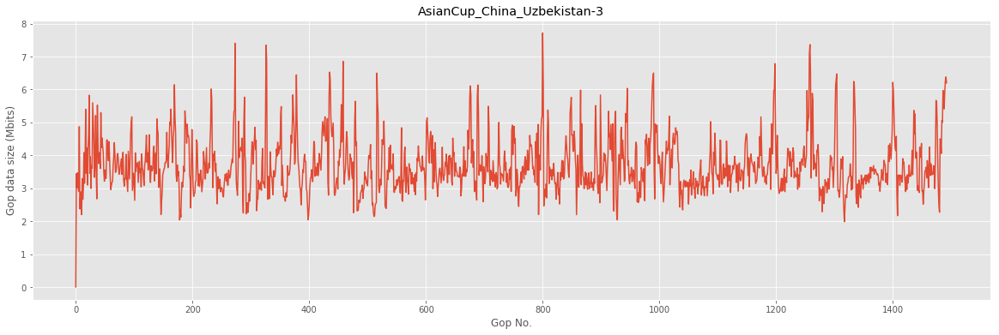

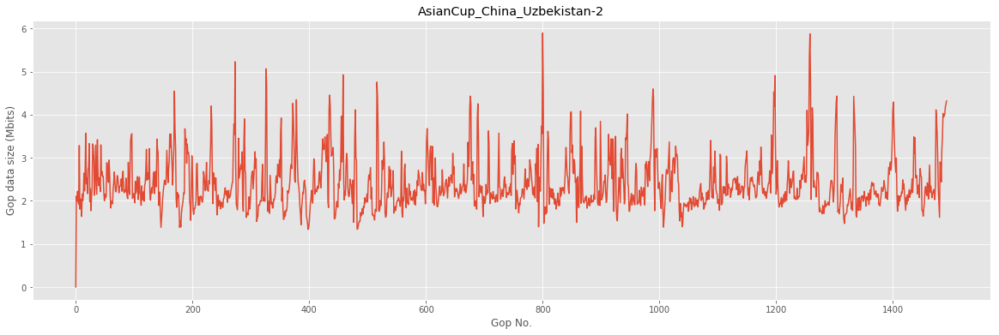

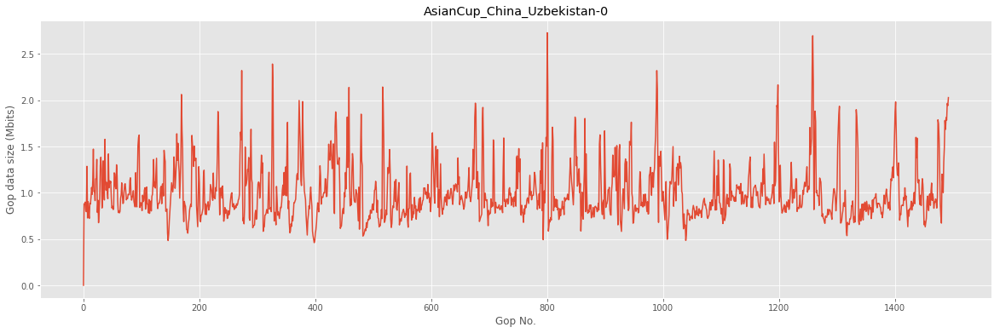

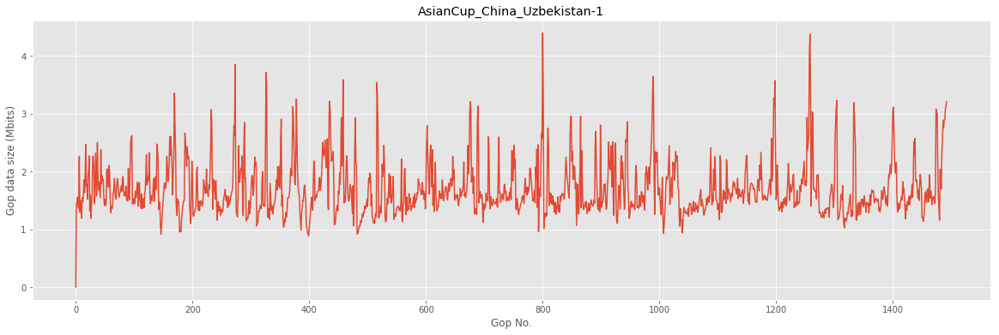

In [38]:
get_analysis_result_video('video_trace/sports/', 'gop', 0)

### Video GoP size analysis

In [4]:
import numpy as np
def get_gop_size(trace_file):
    gop_sizes = []
    with open(trace_file, 'rb') as f:
        gop_size = 0.0
        for line in f:
            parse = line.split()
#             print(parse)
            if int(parse[2]) == 1:
                gop_sizes.append(gop_size)
#                 print(gop_size)
                gop_size = float(parse[1])
            else:
                gop_size += float(parse[1])
    
    gop_sizes = np.array(gop_sizes) / 1000000
    return gop_sizes

In [17]:
# video_trace = 'video_trace/YYF_2018_08_12/frame_trace_'
# video_trace ='video_trace/AsianCup_China_Uzbekistan/frame_trace_'
video_trace ='video_trace/Fengtimo_2018_11_3/frame_trace_'
gop_sizes_group = []
for i in range(4):
    gop_sizes_group.append(get_gop_size(video_trace + str(i)))

In [18]:
s0 = gop_sizes_group[0][1:-1]
s1 = gop_sizes_group[1][1:-1]
s2 = gop_sizes_group[2][1:-1]
s3 = gop_sizes_group[3][1:-1]

In [19]:
def quality_comparison(s_low, s_high):
    res = s_high / s_low
    print('Average: %.5f.' % np.average(res))
    print('Max: %.5f.' % np.max(res))
    print('Min: %.5f.' % np.min(res))

In [20]:
quality_comparison(s0, s1)

Average: 1.70641.
Max: 1.89800.
Min: 1.43304.


In [21]:
quality_comparison(s1, s2)

Average: 1.41329.
Max: 1.55115.
Min: 1.04483.


In [22]:
quality_comparison(s2, s3)

Average: 1.54425.
Max: 1.95626.
Min: 1.17937.


## Network Trace Preprocess
### Mix high, middle, and low together

In [75]:
import os
import shutil

In [78]:
for root, dirnames, filenames in os.walk(os.path.abspath('./network_trace/')):
    for filename in filenames:
        filename = os.path.join(root, filename)
        
        src_file = filename
        
        parse = filename.split('/')
        new_filename = parse[-2] + '-' + parse[-1]
        des_file = os.path.join(os.path.abspath('./network_trace/mix_trace/'), new_filename)
        
        if os.path.exists(des_file):
            continue
        else:
            shutil.copy(src_file, des_file)
            print('%s copied' % new_filename)

high-13 copied
high-17 copied
high-12 copied
high-3 copied
high-0 copied
high-16 copied
high-10 copied
high-11 copied
high-1 copied
high-18 copied
high-6 copied
high-4 copied
high-5 copied
high-19 copied
high-9 copied
high-14 copied
high-2 copied
high-7 copied
high-8 copied
high-15 copied
low-3 copied
low-0 copied
low-24 copied
low-1 copied
low-6 copied
low-21 copied
low-27 copied
low-20 copied
low-25 copied
low-4 copied
low-22 copied
low-5 copied
low-9 copied
low-28 copied
low-2 copied
low-23 copied
low-7 copied
low-29 copied
low-26 copied
low-8 copied
mix_trace-high-5 copied
mix_trace-high-0 copied
mix_trace-low-28 copied
mix_trace-high-19 copied
mix_trace-high-17 copied
mix_trace-high-9 copied
mix_trace-low-1 copied
mix_trace-low-0 copied
mix_trace-low-24 copied
mix_trace-high-7 copied
mix_trace-low-9 copied
mix_trace-high-10 copied
mix_trace-low-22 copied
mix_trace-low-3 copied
mix_trace-low-8 copied
mix_trace-low-23 copied
mix_trace-low-26 copied
mix_trace-high-12 copied
mix_trace